# Landmark Preference: Data-Driven Peak Detection

Detects each animal's landmark response positions from the **population-average**
spatial tuning curve (LastDay session only), then applies those positions as window
centres across all 3 conditions.

Peak positions differ between animals due to inter-animal variability in prism
placement. They are stable within each animal across sessions, so LastDay peaks
are used unchanged for all 3 conditions.

**Replaces** `SensitivityAnalysis_LandmarkWindows.ipynb`.

## Workflow
1. **Run cells 1–3** (setup, sessions, helper functions)
2. **Run cell 4** — inspect plots to see where each animal's 4 peaks are
3. **Edit cell 6** — set `before`/`after` window sizes based on what you see
4. **Run cells 7 onwards** — full analysis + all figures

In [129]:
import sys
sys.path.insert(0, r'C:\Users\jasmineyeo\Documents\GitHub\V1_SpatialModulation')
sys.path.insert(0, r'C:\Users\jasmineyeo\Documents\GitHub\V1_SpatialModulation\3.LandmarkPreference')

import io
import os
import glob
import contextlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import rcParams
from matplotlib.lines import Line2D
from scipy.ndimage import gaussian_filter1d
from scipy.stats import chi2_contingency

from LandmarkPreference_OpenLoopVR_Analysis import (
    identify_landmark_responses,
    analyze_layer_landmark_preferences,
    plot_rejected_cells_response,
)
from helper import files as hfiles
from helper import TwoP
from helper.SpatialModulationIndexLayerSpecific import SpatialModulationIndexLayerSpecific as SMI_Layer

%matplotlib inline

rcParams['legend.fontsize'] = 13
rcParams['axes.labelsize']  = 13
rcParams['axes.titlesize']  = 14
rcParams['xtick.labelsize'] = 11
rcParams['ytick.labelsize'] = 11

CONDITIONS      = ['LastDay', 'OpenLoop_Moving', 'OpenLoop_Stationary']
COND_LABELS     = ['Last Day (Active VR)', 'Day 8 (Running replay)', 'Day 9 (Stationary replay)']
COND_COLORS     = ['#2196F3', '#FF9800', '#E53935']
LAYER_NAMES     = ['L2/3', 'L4', 'L5', 'L6']
LANDMARK_LABELS = ['Q1', 'Q2', 'Q3', 'Q4']
LANDMARK_COLORS = ['#1976D2', '#388E3C', '#F57C00', '#7B1FA2']
ANIMAL_COLORS   = ['#9C27B0', '#009688', '#FF5722', '#607D8B', '#795548']
N_LANDMARKS     = 4

ACROSS_ANIMALS_DIR = r'D:\V1_SpatialModulation\2p\V1_prism\across_animals_OpenLoopVR_Analysis'

print('Setup complete.')

Setup complete.


In [130]:
SESSIONS = [
    {
        'animal_id':           'JSY044',
        'LastDay':             r'D:\V1_SpatialModulation\2p\V1_prism\JSY044_ChronicImaging\250912_JSY_JSY044_SpatialModulation_Day7\TSeries-09122025-1334-001',
        'OpenLoop_Moving':     r'D:\V1_SpatialModulation\2p\V1_prism\JSY044_ChronicImaging\251122_JSY_JSY044_SpMod_OpenLoopVR_Moving\TSeries-11222025-1339-001',
        'OpenLoop_Stationary': r'D:\V1_SpatialModulation\2p\V1_prism\JSY044_ChronicImaging\251123_JSY_JSY044_SpMod_OpenLoopVR_Stationary\TSeries-11232025-1222-001',
        'output_dir':          r'D:\V1_SpatialModulation\2p\V1_prism\JSY044_ChronicImaging\OpenLoopVR_Analysis\LandmarkPreference_DataDriven',
    },
    {
        'animal_id':           'JSY051',
        'LastDay':             r'D:\V1_SpatialModulation\2p\V1_prism\JSY051_ChronicImaging\251104_JSY_JSY051_SpMod_Day4\TSeries-11042025-1418-001',
        # 'LastDay':             r'D:\V1_SpatialModulation\2p\V1_prism\JSY051_ChronicImaging\251105_JSY_JSY051_SpMod_Day5\TSeries-11052025-1512-002',
        'OpenLoop_Moving':     r'D:\V1_SpatialModulation\2p\V1_prism\JSY051_ChronicImaging\251106_JSY_JSY051_SpMO_OpenloopVR_moving\TSeries-11062025-1439-002',
        'OpenLoop_Stationary': r'D:\V1_SpatialModulation\2p\V1_prism\JSY051_ChronicImaging\251107_JSY_JSY051_SpMO_OpenloopVR_stationary\TSeries-11072025-1032-001',
        'output_dir':          r'D:\V1_SpatialModulation\2p\V1_prism\JSY051_ChronicImaging\OpenLoopVR_Analysis\LandmarkPreference_DataDriven',
    },
    {
        'animal_id':           'JSY052',
        'LastDay':             r'D:\V1_SpatialModulation\2p\V1_prism\JSY052_ChronicImaging\251015_JSY_JSY052_SpatialModulation_Day7\TSeries-10152025-1103-001',
        'OpenLoop_Moving':     r'D:\V1_SpatialModulation\2p\V1_prism\JSY052_ChronicImaging\251122_JSY_JSY052_SpMod_OpenLoopVR_Moving\TSeries-11222025-1339-001',
        'OpenLoop_Stationary': r'D:\V1_SpatialModulation\2p\V1_prism\JSY052_ChronicImaging\251123_JSY_JSY052_SpMod_OpenLoopVR_Stationary\TSeries-11232025-1222-002',
        'output_dir':          r'D:\V1_SpatialModulation\2p\V1_prism\JSY052_ChronicImaging\OpenLoopVR_Analysis\LandmarkPreference_DataDriven',
    },
    {
        'animal_id':           'JSY054',
        'LastDay':             r'D:\V1_SpatialModulation\2p\V1_prism\JSY054_ChronicImaging\251105_JSY_JSY054_SpMod_Day7\TSeries-11052025-1512-001',
        'OpenLoop_Moving':     r'D:\V1_SpatialModulation\2p\V1_prism\JSY054_ChronicImaging\251106_JSY_JSY054_SpMO_OpenloopVR_moving\TSeries-11062025-1439-001',
        'OpenLoop_Stationary': r'D:\V1_SpatialModulation\2p\V1_prism\JSY054_ChronicImaging\251107_JSY_JSY054_SpMO_OpenloopVR_stationary\TSeries-11072025-1032-001',
        'output_dir':          r'D:\V1_SpatialModulation\2p\V1_prism\JSY054_ChronicImaging\OpenLoopVR_Analysis\LandmarkPreference_DataDriven',
    },
    {
        'animal_id':           'JSY055',
        'LastDay':             r'D:\V1_SpatialModulation\2p\V1_prism\JSY055_ChronicImaging\251211_JSY_JSY055_SpatialModulation_Day7\TSeries-12112025-1631-001',
        'OpenLoop_Moving':     r'D:\V1_SpatialModulation\2p\V1_prism\JSY055_ChronicImaging\251212_JSY_JSY055_SpatialModulation_OpenLoopVR_Moving\TSeries-12122025-1421-001',
        'OpenLoop_Stationary': r'D:\V1_SpatialModulation\2p\V1_prism\JSY055_ChronicImaging\251213_JSY_JSY055_SpatialModulation_OpenLoopVR_Stationary\TSeries-12132025-1711-001',
        'output_dir':          r'D:\V1_SpatialModulation\2p\V1_prism\JSY055_ChronicImaging\OpenLoopVR_Analysis\LandmarkPreference_DataDriven',
    },
]

INCLUDE_ANIMALS = ['JSY044', 'JSY051', 'JSY052', 'JSY054', 'JSY055']

included_sessions = [s for s in SESSIONS if s['animal_id'] in INCLUDE_ANIMALS]
print(f'Animals: {[s["animal_id"] for s in included_sessions]}')

Animals: ['JSY044', 'JSY051', 'JSY052', 'JSY054', 'JSY055']


In [131]:
# ── Analysis parameters ───────────────────────────────────────────────────────
SMOOTH_SIGMA_CM      = 3.0            # Gaussian sigma for peak-detection smoothing (cm)
EXPECTED_POSITIONS   = [30, 60, 90, 120]  # expected landmark centres in cm
SEARCH_HALF_WIDTH_CM = 10.0           # search ± this around each expected position
BOUNDARY_EXCLUSION   = (5, 5)
EXCLUDE_FIRST_BINS   = 5
EXCLUDE_LAST_BINS    = 5
SMOOTHING_SIGMA      = 1.0            # sigma used in landmark response identification


def detect_population_peaks(session_dir, n_landmarks=N_LANDMARKS):
    """
    For each expected landmark position, find the local maximum of the
    population-average spatial tuning curve within ±SEARCH_HALF_WIDTH_CM.

    This handles inter-animal variability in prism placement — all peaks
    shift by a consistent offset per animal, so searching around known
    expected positions (rather than free peak-finding) is robust.
    Only requires the preproc .h5 file — no TwoP / Suite2p needed.
    """
    preproc_files = glob.glob(os.path.join(session_dir, '*preproc*.h5'))
    if not preproc_files:
        raise ValueError(f'No preproc .h5 found in {session_dir}')

    pre          = hfiles.read_h5(preproc_files[0])
    norm_spatial = pre['norm_spatial_activity']   # (n_cells, n_laps, n_bins)
    bin_centers  = pre['bin_centers']
    rel_idx      = np.where(pre['combined_reliable'])[0]
    norm_rel     = norm_spatial[rel_idx]

    # Mean over laps, then mean over cells -> (n_bins,)
    mean_curve = np.mean(np.mean(norm_rel, axis=1), axis=0)
    bin_width  = np.mean(np.diff(bin_centers))
    smoothed   = gaussian_filter1d(mean_curve, sigma=SMOOTH_SIGMA_CM / bin_width)

    global_max = float(np.max(smoothed))

    detected_bins = []
    for qi, exp_pos in enumerate(EXPECTED_POSITIONS[:n_landmarks]):
        win_lo   = exp_pos - SEARCH_HALF_WIDTH_CM
        win_hi   = exp_pos + SEARCH_HALF_WIDTH_CM
        win_mask = (bin_centers >= win_lo) & (bin_centers <= win_hi)

        if not win_mask.any():
            raise RuntimeError(
                f'Q{qi+1} search window [{win_lo:.0f}, {win_hi:.0f}] cm falls '
                f'outside track range [{bin_centers[0]:.0f}, {bin_centers[-1]:.0f}] cm — '
                'adjust EXPECTED_POSITIONS or SEARCH_HALF_WIDTH_CM')

        win_bins  = np.where(win_mask)[0]
        local_max = float(np.max(smoothed[win_bins]))
        best_bin  = win_bins[int(np.argmax(smoothed[win_bins]))]

        if local_max < 0.1 * global_max:
            print(f'  NOTE Q{qi+1}: response in [{win_lo:.0f}, {win_hi:.0f}] cm is very weak '
                  f'(local max = {local_max:.3f}, global max = {global_max:.3f}) — '
                  'consider widening SEARCH_HALF_WIDTH_CM')

        detected_bins.append(best_bin)

    peaks = np.array(detected_bins)

    return {
        'peak_positions_cm': list(bin_centers[peaks]),
        'peak_bin_indices':  peaks.tolist(),
        'mean_curve':        mean_curve,
        'smoothed_curve':    smoothed,
        'bin_centers':       bin_centers,
        'n_reliable':        len(rel_idx),
    }


def load_session_data(session_dir):
    """Load preproc data + layer assignments for reliable cells."""
    preproc_files = glob.glob(os.path.join(session_dir, '*preproc*.h5'))
    if not preproc_files:
        raise ValueError(f'No preproc .h5 found in {session_dir}')

    pre          = hfiles.read_h5(preproc_files[0])
    norm_spatial = pre['norm_spatial_activity']
    bin_centers  = pre['bin_centers']
    reliable     = pre['combined_reliable']

    twoP_fn  = os.path.basename(session_dir)
    raw_twop = TwoP(session_dir, twoP_fn)
    raw_twop.find_files()
    twop_dict  = raw_twop.calc_dFF()
    med_coords = np.array([cell['med'] for cell in twop_dict['stat']])
    layer_cells, _ = SMI_Layer.identify_layers(med_coords)

    rel_idx               = np.where(reliable)[0]
    norm_spatial_reliable = norm_spatial[rel_idx]
    layer_cells_reliable  = {
        layer: np.where(np.isin(rel_idx, idx))[0]
        for layer, idx in layer_cells.items()
    }
    return norm_spatial_reliable, bin_centers, layer_cells_reliable, len(rel_idx)


print('Helper functions defined.')

Helper functions defined.


Detecting peaks: JSY044 ...  401 reliable cells  |  peaks: Q1=35.5cm, Q2=62.5cm, Q3=89.5cm, Q4=119.5cm
Detecting peaks: JSY051 ...  304 reliable cells  |  peaks: Q1=34.5cm, Q2=65.5cm, Q3=95.5cm, Q4=122.5cm
Detecting peaks: JSY052 ...  98 reliable cells  |  peaks: Q1=39.5cm, Q2=66.5cm, Q3=97.5cm, Q4=123.5cm
Detecting peaks: JSY054 ...  465 reliable cells  |  peaks: Q1=28.5cm, Q2=58.5cm, Q3=89.5cm, Q4=120.5cm
Detecting peaks: JSY055 ...  226 reliable cells  |  peaks: Q1=37.5cm, Q2=65.5cm, Q3=92.5cm, Q4=122.5cm


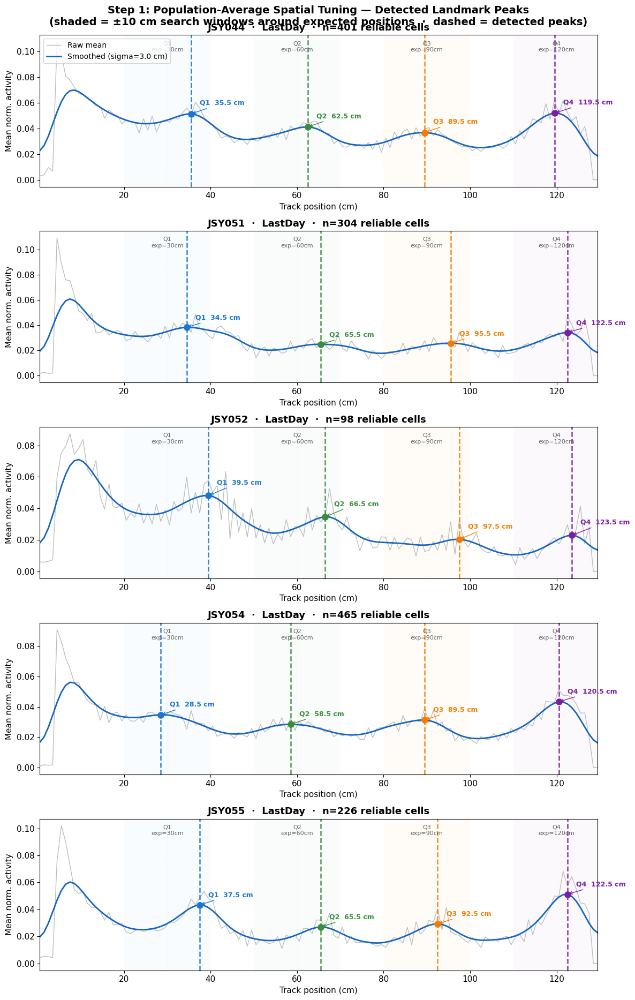

In [132]:
# ══════════════════════════════════════════════════════════════════════════════
# STEP 1  ─  Detect landmark peaks (LastDay population average)
#
# Run this cell and inspect the plots BEFORE editing the window config (cell 6).
# Each panel shows:
#   - shaded zones: ±SEARCH_HALF_WIDTH_CM search windows around each expected position
#   - grey line:    raw population mean
#   - blue line:    smoothed curve used for peak detection
#   - dashed lines: detected peaks (local maxima within each search window)
# ══════════════════════════════════════════════════════════════════════════════

DETECTED_PEAKS = {}   # filled here; used in steps 2 and 3

ZONE_COLORS = ['#E3F2FD', '#E8F5E9', '#FFF3E0', '#F3E5F5']

n_animals = len(included_sessions)
fig, axes = plt.subplots(n_animals, 1, figsize=(12, 3.8 * n_animals), sharex=False)
if n_animals == 1:
    axes = [axes]

for ax, s in zip(axes, included_sessions):
    animal = s['animal_id']
    print(f'Detecting peaks: {animal} ...', end='  ')
    try:
        det = detect_population_peaks(s['LastDay'])
    except Exception as e:
        print(f'ERROR: {e}')
        ax.set_title(f'{animal} — DETECTION FAILED: {e}', color='red', fontsize=12)
        continue

    peaks_cm = det['peak_positions_cm']
    bc       = det['bin_centers']
    raw_crv  = det['mean_curve']
    smt_crv  = det['smoothed_curve']
    n_rel    = det['n_reliable']
    DETECTED_PEAKS[animal] = peaks_cm
    print(f'{n_rel} reliable cells  |  peaks: ' +
          ', '.join(f'Q{i+1}={p:.1f}cm' for i, p in enumerate(peaks_cm)))

    # Search window backgrounds (±SEARCH_HALF_WIDTH_CM around each expected position)
    for qi, exp_pos in enumerate(EXPECTED_POSITIONS):
        win_lo = exp_pos - SEARCH_HALF_WIDTH_CM
        win_hi = exp_pos + SEARCH_HALF_WIDTH_CM
        ax.axvspan(win_lo, win_hi, alpha=0.22, color=ZONE_COLORS[qi], lw=0)
        ax.axvline(exp_pos, color=ZONE_COLORS[qi], lw=1.0, ls=':', alpha=0.6)
        ax.text(exp_pos, 0.96, f'Q{qi+1}\nexp={exp_pos}cm',
                ha='center', va='top', fontsize=8, color='#616161',
                transform=ax.get_xaxis_transform())

    # Curves
    ax.plot(bc, raw_crv, color='#BDBDBD', lw=1.0, label='Raw mean')
    ax.plot(bc, smt_crv, color='#1565C0', lw=2.0,
            label=f'Smoothed (sigma={SMOOTH_SIGMA_CM} cm)')

    # Detected peaks
    y_top = float(np.max(smt_crv))
    for qi, p_cm in enumerate(peaks_cm):
        p_bin = np.argmin(np.abs(bc - p_cm))
        y_p   = float(smt_crv[p_bin])
        ax.axvline(p_cm, color=LANDMARK_COLORS[qi], lw=1.8, ls='--', alpha=0.9)
        ax.scatter([p_cm], [y_p], s=65, color=LANDMARK_COLORS[qi], zorder=5)
        ax.annotate(
            f'Q{qi+1}  {p_cm:.1f} cm',
            xy=(p_cm, y_p),
            xytext=(p_cm + 2, y_p + 0.10 * y_top),
            fontsize=9, color=LANDMARK_COLORS[qi], fontweight='bold',
            arrowprops=dict(arrowstyle='->', color=LANDMARK_COLORS[qi], lw=1.0),
        )

    ax.set_title(f'{animal}  ·  LastDay  ·  n={n_rel} reliable cells',
                 fontsize=13, fontweight='bold')
    ax.set_xlabel('Track position (cm)', fontsize=11)
    ax.set_ylabel('Mean norm. activity', fontsize=11)
    ax.set_xlim(bc[0], bc[-1])

axes[0].legend(fontsize=10, loc='upper left')
fig.suptitle(
    'Step 1: Population-Average Spatial Tuning — Detected Landmark Peaks\n'
    f'(shaded = ±{SEARCH_HALF_WIDTH_CM:.0f} cm search windows around expected positions  '
    f'·  dashed = detected peaks)',
    fontsize=14, fontweight='bold',
)
plt.tight_layout()
os.makedirs(ACROSS_ANIMALS_DIR, exist_ok=True)
fig.savefig(os.path.join(ACROSS_ANIMALS_DIR, 'DataDriven_Step1_PeakDetection.png'),
            dpi=150, bbox_inches='tight')
plt.show()

## Step 2 — Configure Response Windows

Based on the peak detection plots above, fill in `before` and `after` (in cm) for each animal.

- **`before`**: cm **before** the detected peak to include in the window
- **`after`**: cm **after** the detected peak to include in the window

**Decision guide:**
- Peak near the **left edge** of its expected zone → larger `before`, small `after`
- Peak near the **right edge** → larger `after`, small `before`
- Peak well-centred → symmetric (e.g. `before=15, after=10`)

Check the printed window ranges in the next cell — make sure adjacent windows don't overlap.

In [133]:
# ══════════════════════════════════════════════════════════════════════════════
# STEP 2  ─  Window configuration
# Edit the before/after values below, then run this cell to see window ranges.
# Each list has 4 entries: [Q1, Q2, Q3, Q4] in order of detected peak.
# ══════════════════════════════════════════════════════════════════════════════

ANIMAL_WINDOW_CONFIG = {
    'JSY044': [{'before': 15, 'after': 10}] * 4,
    'JSY051': [{'before': 15, 'after': 10}] * 4,
    'JSY052': [{'before': 15, 'after': 10}] * 4,
    'JSY054': [{'before': 15, 'after': 10}] * 4,
    'JSY055': [{'before': 15, 'after':  10}] * 4,
}

# ── Sanity check: print resulting window ranges ────────────────────────────────
print('Window ranges  [peak - before,  peak + after]  (cm):')
for animal, windows in ANIMAL_WINDOW_CONFIG.items():
    if animal not in DETECTED_PEAKS:
        print(f'  {animal}: no peaks detected — run Step 1 first')
        continue
    peaks = DETECTED_PEAKS[animal]
    parts = [f'Q{qi+1}=[{p - w["before"]:.0f}, {p + w["after"]:.0f}]'
             for qi, (p, w) in enumerate(zip(peaks, windows))]
    print(f'  {animal}: {"  ".join(parts)}')

Window ranges  [peak - before,  peak + after]  (cm):
  JSY044: Q1=[20, 45]  Q2=[47, 72]  Q3=[74, 99]  Q4=[104, 129]
  JSY051: Q1=[19, 44]  Q2=[50, 75]  Q3=[80, 105]  Q4=[107, 132]
  JSY052: Q1=[24, 49]  Q2=[51, 76]  Q3=[82, 107]  Q4=[108, 133]
  JSY054: Q1=[13, 38]  Q2=[43, 68]  Q3=[74, 99]  Q4=[105, 130]
  JSY055: Q1=[22, 47]  Q2=[50, 75]  Q3=[77, 102]  Q4=[107, 132]


## Step 3 — Run Landmark Preference Analysis

Uses the data-driven peaks (Step 1) and configured windows (Step 2) to compute
landmark preferences for every animal × condition × layer.

All 3 conditions share the same peak positions (detected from LastDay), since
prism placement — and therefore response position — is stable within each animal
across sessions.

In [134]:
# ══════════════════════════════════════════════════════════════════════════════
# STEP 3  ─  Run landmark preference analysis
# ══════════════════════════════════════════════════════════════════════════════

all_results = {}   # {animal: {cond: {layer: {'proportions','counts','n_cells'}, '_raw': {...}}}}

for s in included_sessions:
    animal  = s['animal_id']
    peaks   = DETECTED_PEAKS.get(animal)
    windows = ANIMAL_WINDOW_CONFIG.get(animal)

    if peaks is None:
        print(f'Skipping {animal}: no detected peaks (run Step 1 first).')
        continue

    all_results[animal] = {}

    for cond in CONDITIONS:
        print(f'  {animal} / {cond} ... ', end='')
        try:
            norm_sp, bin_ctrs, layer_cells, n_rel = load_session_data(s[cond])
        except Exception as e:
            print(f'ERROR: {e}')
            all_results[animal][cond] = {}
            continue

        print(f'{n_rel} reliable cells')
        rel_valid = np.ones(n_rel, dtype=bool)

        with contextlib.redirect_stdout(io.StringIO()):
            lm_res  = identify_landmark_responses(
                norm_sp, bin_ctrs, peaks,
                landmark_windows_config=windows,
                boundary_exclusion=BOUNDARY_EXCLUSION,
                smoothing_sigma=SMOOTHING_SIGMA,
                exclude_first_bins=EXCLUDE_FIRST_BINS,
                exclude_last_bins=EXCLUDE_LAST_BINS,
            )
            lyr_res = analyze_layer_landmark_preferences(lm_res, layer_cells, rel_valid)

        cond_data = {}
        for layer in LAYER_NAMES:
            lr = lyr_res.get(layer)
            if lr is not None and lr.get('stats', {}).get('n_cells', 0) > 0:
                cond_data[layer] = {
                    'proportions': lr['landmark_proportions'].copy(),
                    'counts':      lr['landmark_counts'].copy(),
                    'n_cells':     int(lr['stats']['n_cells']),
                }
            else:
                cond_data[layer] = None

        # Store raw results for waterfall / rejected-cell plots
        cond_data['_raw'] = {
            'lm_res':      lm_res,
            'layer_cells': layer_cells,
            'bin_centers': bin_ctrs,
        }
        all_results[animal][cond] = cond_data

        summary = {lyr: (cond_data[lyr]['n_cells'] if cond_data[lyr] else 0)
                   for lyr in LAYER_NAMES}
        print(f'    landmark-pref cells: {summary}')

animals    = [s['animal_id'] for s in included_sessions if s['animal_id'] in all_results]
mean_peaks = np.mean([DETECTED_PEAKS[a] for a in animals], axis=0)
peak_labels = [f'Q{i+1}\n(~{p:.0f} cm)' for i, p in enumerate(mean_peaks)]

print(f'\nAnalysis complete. Animals: {animals}')

  JSY044 / LastDay ... Automatically detected peak density at y = 369.04
Layer 2/3: 291 cells in from 77.00 to 296.04
Layer 4: 371 cells in from 296.04 to 442.04
Layer 5: 127 cells in from 442.04 to 600.04
Layer 6: 58 cells in from 600.04 to 673.00
401 reliable cells
    landmark-pref cells: {'L2/3': 87, 'L4': 90, 'L5': 30, 'L6': 13}
  JSY044 / OpenLoop_Moving ... Automatically detected peak density at y = 362.95
Layer 2/3: 263 cells in from 70.00 to 289.95
Layer 4: 424 cells in from 289.95 to 435.95
Layer 5: 149 cells in from 435.95 to 593.95
Layer 6: 60 cells in from 593.95 to 721.00
280 reliable cells
    landmark-pref cells: {'L2/3': 25, 'L4': 37, 'L5': 8, 'L6': 3}
  JSY044 / OpenLoop_Stationary ... Automatically detected peak density at y = 357.08
Layer 2/3: 387 cells in from 47.00 to 284.08
Layer 4: 391 cells in from 284.08 to 430.08
Layer 5: 148 cells in from 430.08 to 588.08
Layer 6: 60 cells in from 588.08 to 655.00
315 reliable cells
    landmark-pref cells: {'L2/3': 33, 'L4'

In [135]:
# ── Waterfall visualization helpers ──────────────────────────────────────────

_PARULA_COLORS = [
    (0.2422, 0.1504, 0.6603), (0.2108, 0.3706, 0.9717),
    (0.0196, 0.5804, 0.8745), (0.0863, 0.6510, 0.7490),
    (0.1961, 0.6980, 0.6039), (0.3647, 0.7412, 0.5176),
    (0.6275, 0.7647, 0.3843), (0.8510, 0.7882, 0.1961),
    (0.9686, 0.8235, 0.0667), (0.9765, 0.9843, 0.0510),
]
PARULA = mcolors.LinearSegmentedColormap.from_list('parula', _PARULA_COLORS)


def _draw_waterfall(ax, mean_profiles, bin_centers, detected_peaks, window_config,
                    lm_idx, cond_label, layer_label=''):
    """
    Single waterfall panel: cells sorted by peak position, min-max normalised per cell.
    Green shading = this landmark's response window. Red dashed = all landmark positions.
    """
    tbc = bin_centers[EXCLUDE_FIRST_BINS : len(bin_centers) - EXCLUDE_LAST_BINS]
    n_cells = len(mean_profiles)

    lm_pos = detected_peaks[lm_idx]
    lstr   = f' | {layer_label}' if layer_label else ''
    title  = f'Q{lm_idx+1} ({lm_pos:.0f} cm){lstr}\n{cond_label} | n={n_cells}'

    if n_cells == 0:
        ax.text(0.5, 0.5, 'No cells', ha='center', va='center',
                transform=ax.transAxes, fontsize=10, color='gray')
        ax.set_title(title, fontsize=10, fontweight='bold')
        return

    trimmed  = mean_profiles[:, EXCLUDE_FIRST_BINS : len(bin_centers) - EXCLUDE_LAST_BINS]
    sort_idx = np.argsort(np.argmax(trimmed, axis=1))
    trimmed  = trimmed[sort_idx]

    mat = np.zeros_like(trimmed)
    for i in range(len(trimmed)):
        lo, hi = trimmed[i].min(), trimmed[i].max()
        mat[i] = (trimmed[i] - lo) / (hi - lo) if hi > lo else trimmed[i]

    ax.imshow(mat, aspect='auto', cmap=PARULA, interpolation='nearest', vmin=0, vmax=1)

    # Red dashed lines at all detected landmark positions
    for p_cm in detected_peaks:
        ax.axvline(np.argmin(np.abs(tbc - p_cm)), color='red', ls='--', alpha=0.45, lw=1.2)

    # Green shaded window + solid centre line for this landmark
    w       = window_config[lm_idx]
    wlo_bin = np.argmin(np.abs(tbc - (lm_pos - w['before'])))
    whi_bin = np.argmin(np.abs(tbc - (lm_pos + w['after'])))
    ax.axvspan(wlo_bin, whi_bin, alpha=0.15, color='green')
    ax.axvline(np.argmin(np.abs(tbc - lm_pos)), color='green', ls='-', alpha=0.85, lw=2)

    tick_pos = np.linspace(0, len(tbc) - 1, 5).astype(int)
    ax.set_xticks(tick_pos)
    ax.set_xticklabels([f'{tbc[i]:.0f}' for i in tick_pos], fontsize=9)
    ax.set_xlabel('Position (cm)', fontsize=10)
    ax.set_ylabel('Cell # (sorted by peak)', fontsize=10)
    ax.set_title(title, fontsize=10, fontweight='bold')


def _get_lm_profiles(lm_res, layer_idx, lm_idx):
    """
    Return mean_profiles rows for cells that are valid, prefer lm_idx,
    and (optionally) belong to layer_idx. Pass layer_idx=None to pool all layers.
    """
    valid    = lm_res['valid_cells']
    pref     = lm_res['preferred_landmark']
    profiles = lm_res['mean_profiles']

    mask     = valid & (pref == lm_idx)
    lm_cells = np.where(mask)[0]

    if layer_idx is not None and len(layer_idx) > 0:
        lm_cells = np.intersect1d(lm_cells, layer_idx)

    return profiles[lm_cells] if len(lm_cells) > 0 else np.zeros((0, profiles.shape[1]))


print('Waterfall helpers defined.')

Waterfall helpers defined.


JSY044 | Last Day (Active VR) — valid=220  rejected=181


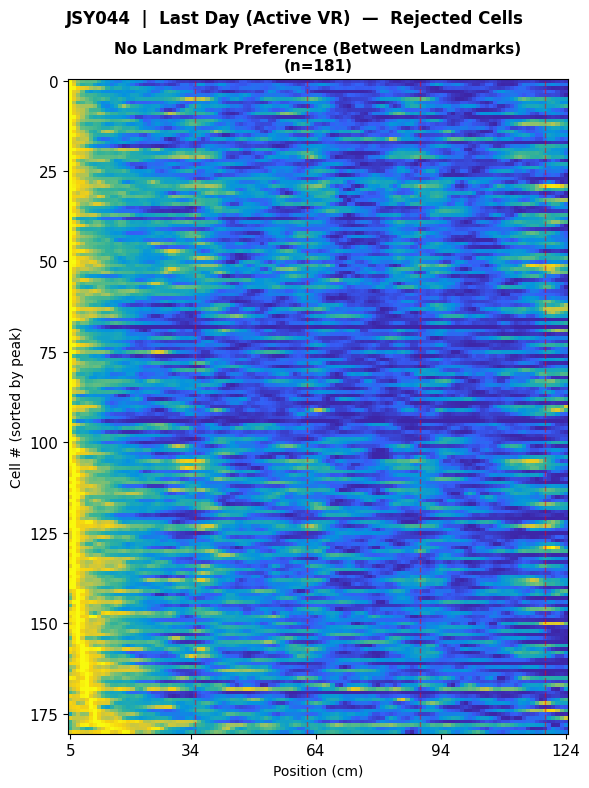

JSY044 | Day 8 (Running replay) — valid=73  rejected=207


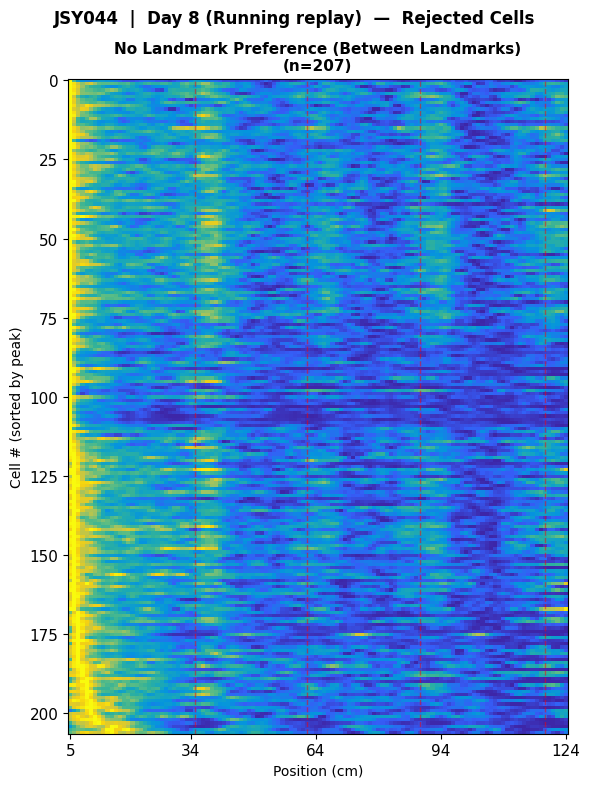

JSY044 | Day 9 (Stationary replay) — valid=87  rejected=228


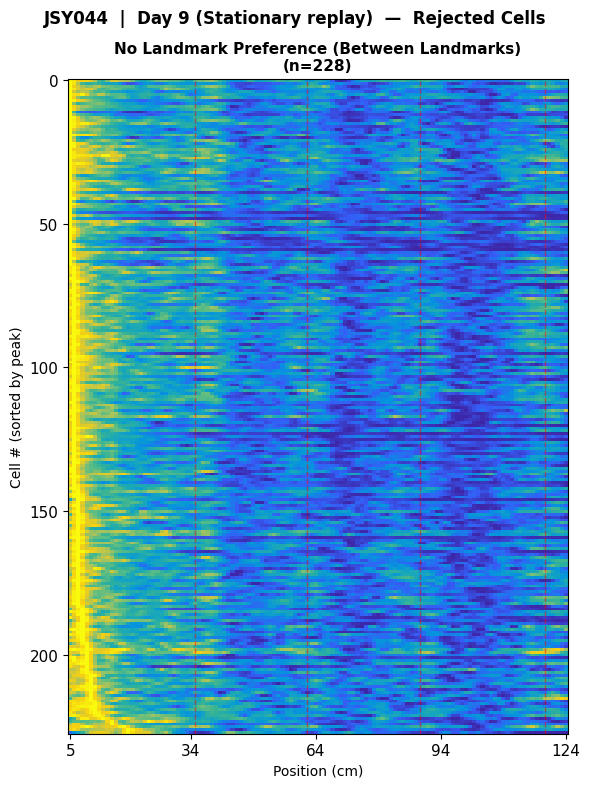

JSY051 | Last Day (Active VR) — valid=154  rejected=150


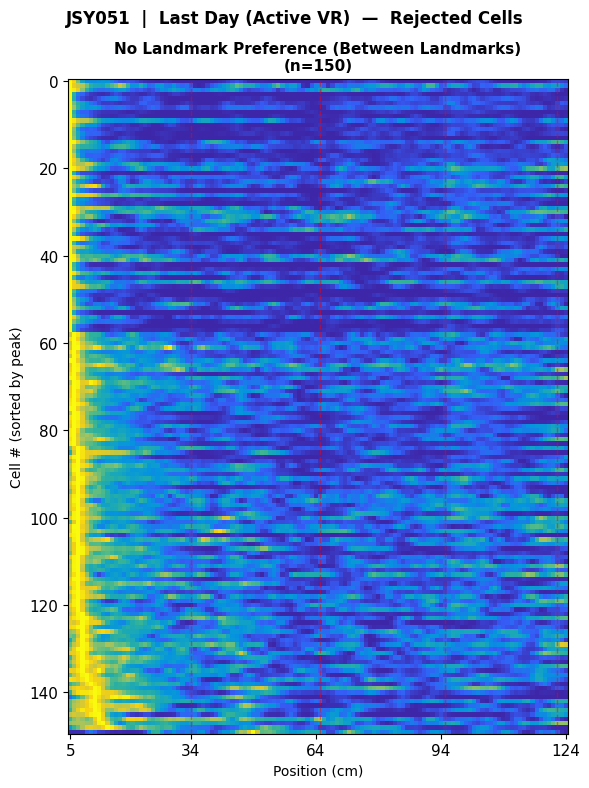

JSY051 | Day 8 (Running replay) — valid=187  rejected=229


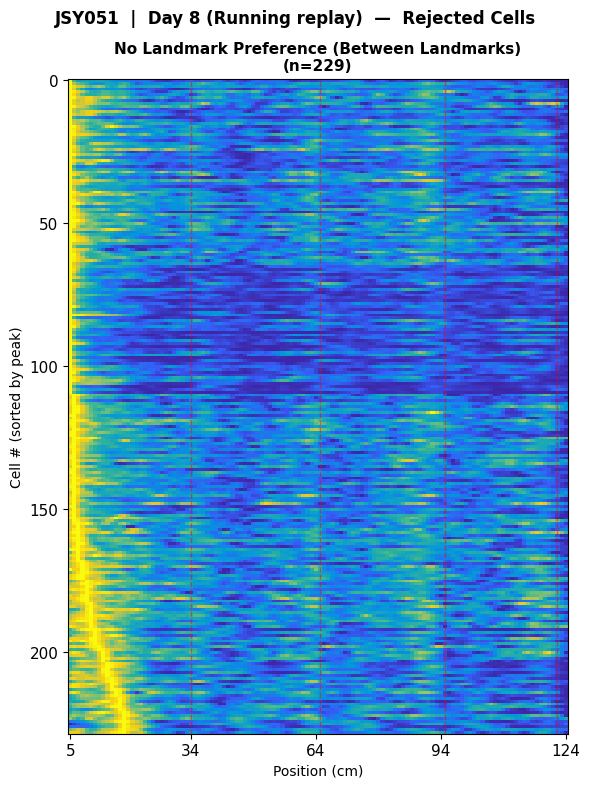

JSY051 | Day 9 (Stationary replay) — valid=215  rejected=192


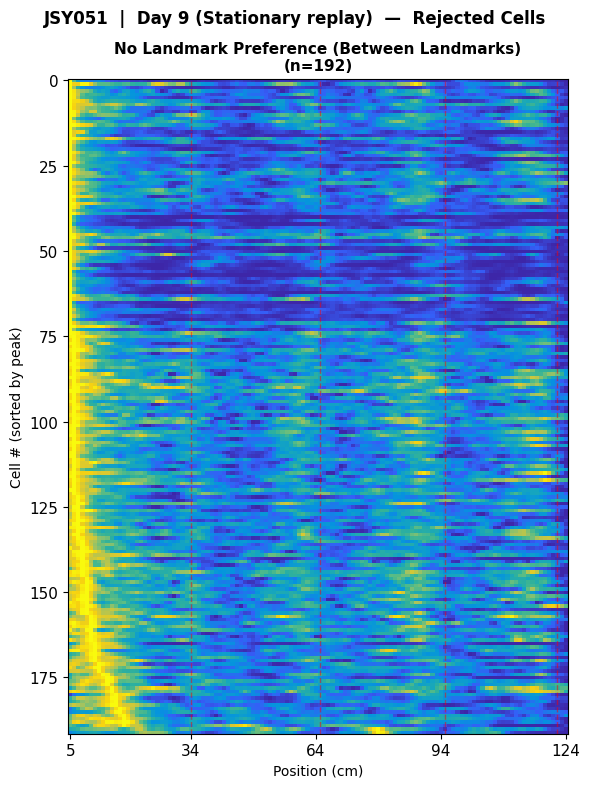

JSY052 | Last Day (Active VR) — valid=51  rejected=47


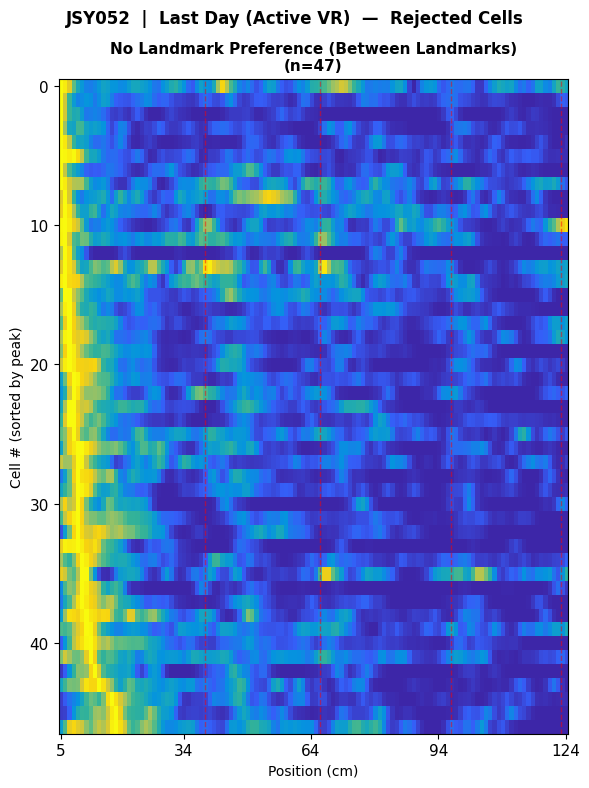

JSY052 | Day 8 (Running replay) — valid=61  rejected=456


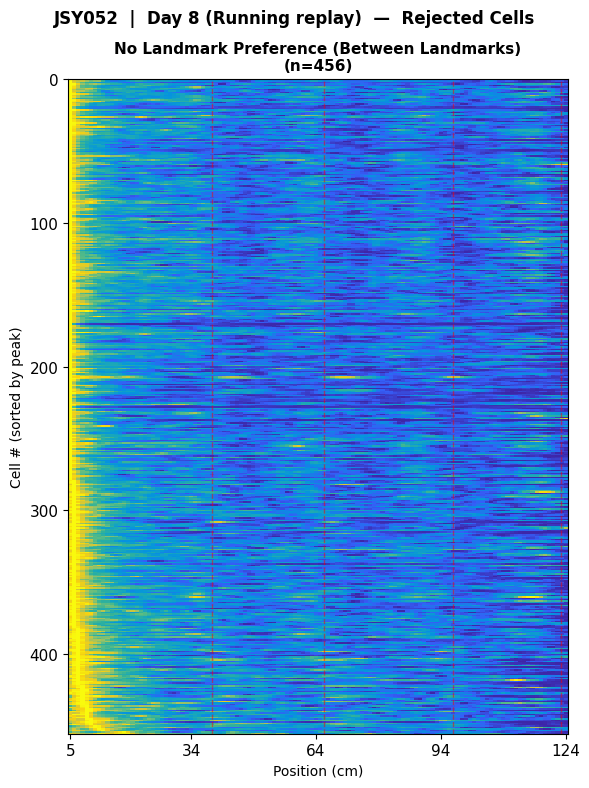

JSY052 | Day 9 (Stationary replay) — valid=60  rejected=514


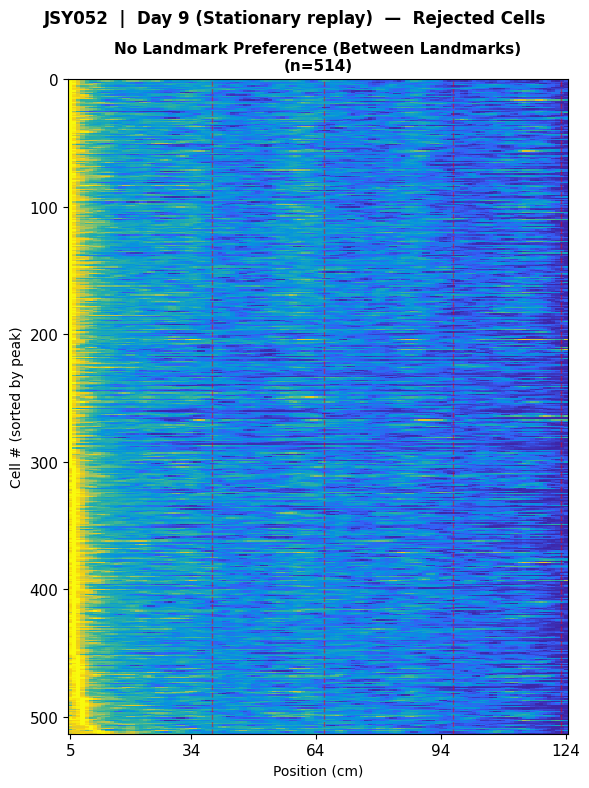

JSY054 | Last Day (Active VR) — valid=262  rejected=203


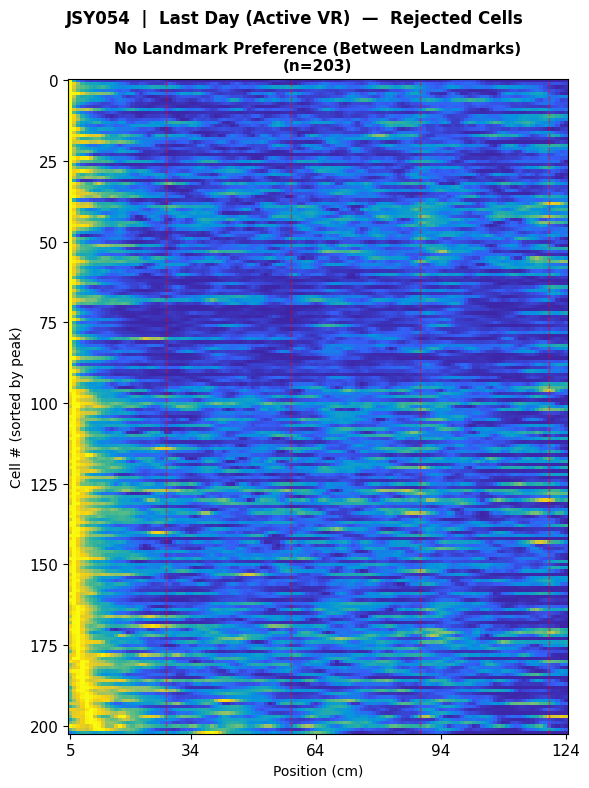

JSY054 | Day 8 (Running replay) — valid=250  rejected=171


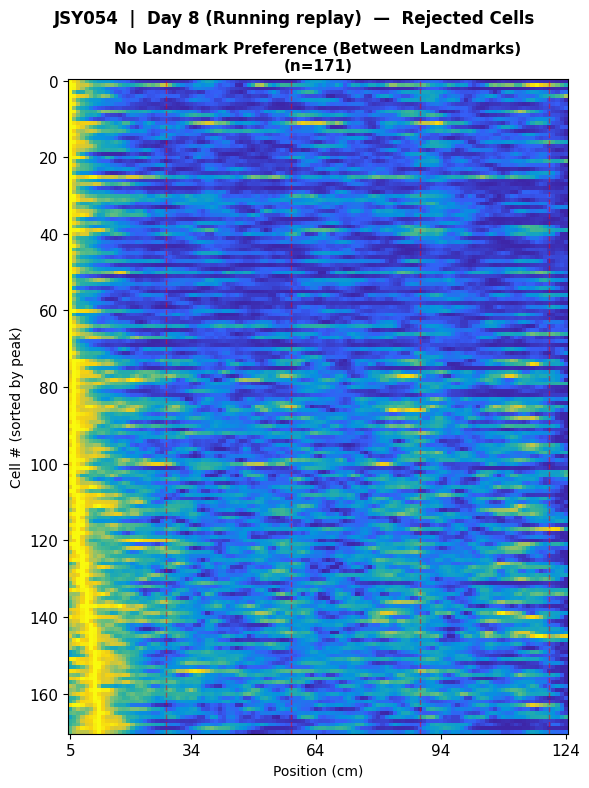

JSY054 | Day 9 (Stationary replay) — valid=256  rejected=120


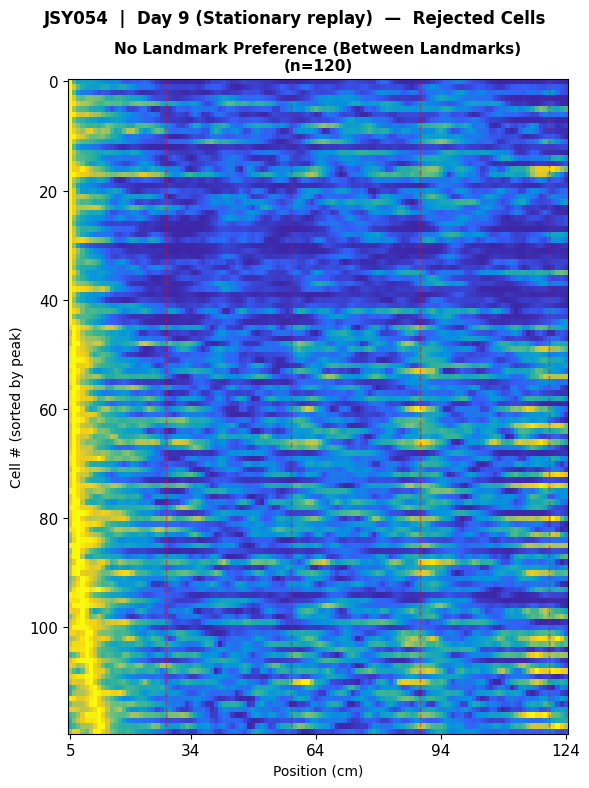

JSY055 | Last Day (Active VR) — valid=122  rejected=104


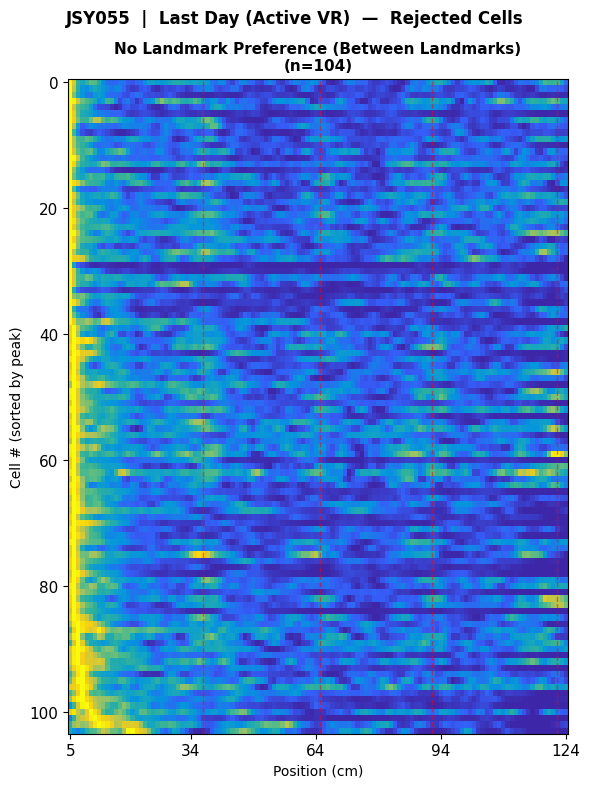

JSY055 | Day 8 (Running replay) — valid=79  rejected=61


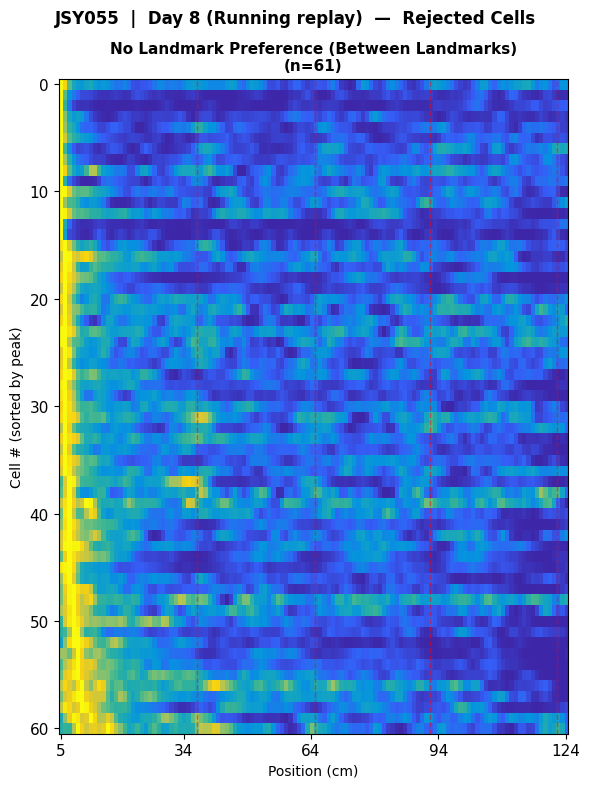

JSY055 | Day 9 (Stationary replay) — valid=91  rejected=89


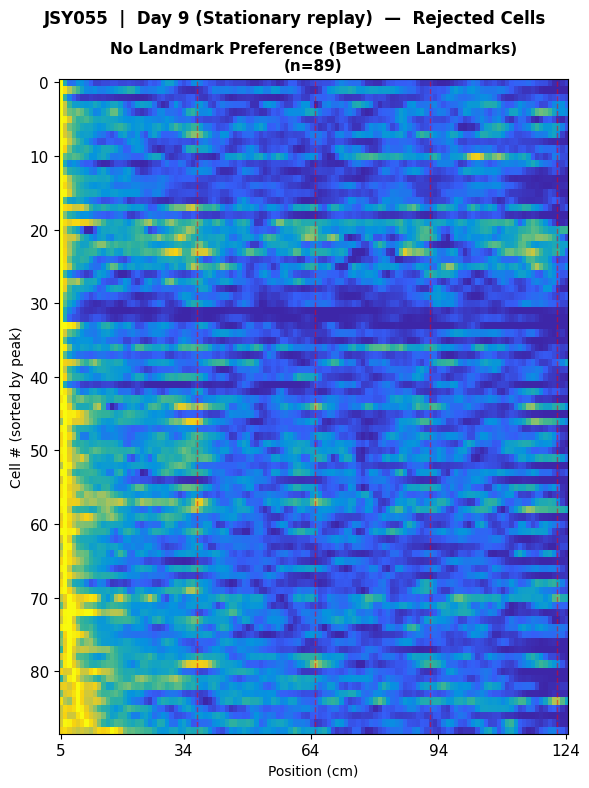

In [136]:
# ── Step 4a: Rejected cells response plots ────────────────────────────────────
# One figure per animal × condition, via plot_rejected_cells_response.

for s in included_sessions:
    animal  = s['animal_id']
    out_dir = s['output_dir']
    if animal not in all_results:
        continue
    os.makedirs(out_dir, exist_ok=True)

    peaks_cm = DETECTED_PEAKS[animal]

    for cond, cond_label in zip(CONDITIONS, COND_LABELS):
        raw = all_results[animal].get(cond, {}).get('_raw')
        if raw is None:
            print(f'{animal} | {cond_label}: no data')
            continue

        lm_res      = raw['lm_res']
        bin_centers = raw['bin_centers']

        n_rej = sum(len(v) for v in lm_res['rejected_cells'].values())
        n_val = int(np.sum(lm_res['valid_cells']))
        print(f'{animal} | {cond_label} — valid={n_val}  rejected={n_rej}')

        fig = plot_rejected_cells_response(
            lm_res, bin_centers,
            landmark_positions=peaks_cm,
            trim_start_bins=EXCLUDE_FIRST_BINS,
            trim_end_bins=EXCLUDE_LAST_BINS,
        )
        cond_safe = cond.replace('/', '_')
        fig.suptitle(f'{animal}  |  {cond_label}  —  Rejected Cells',
                     fontsize=12, fontweight='bold')
        plt.tight_layout()
        fig.savefig(os.path.join(out_dir, f'{animal}_{cond_safe}_rejected.pdf'),
                    bbox_inches='tight')
        plt.show()

Saved: JSY044_waterfall_allLayers.pdf


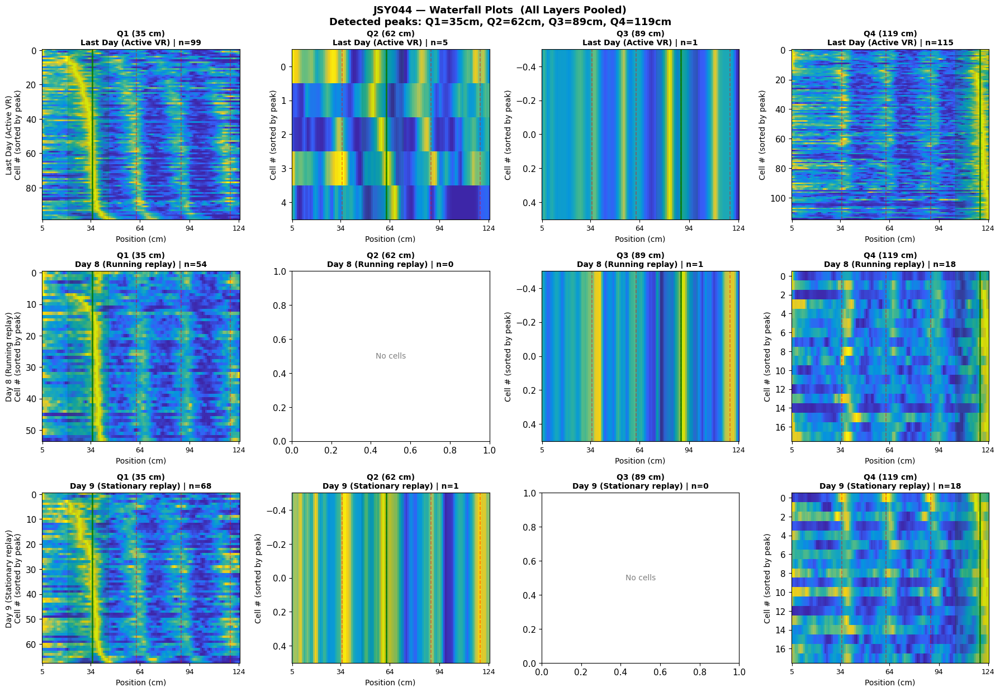

Saved: JSY051_waterfall_allLayers.pdf


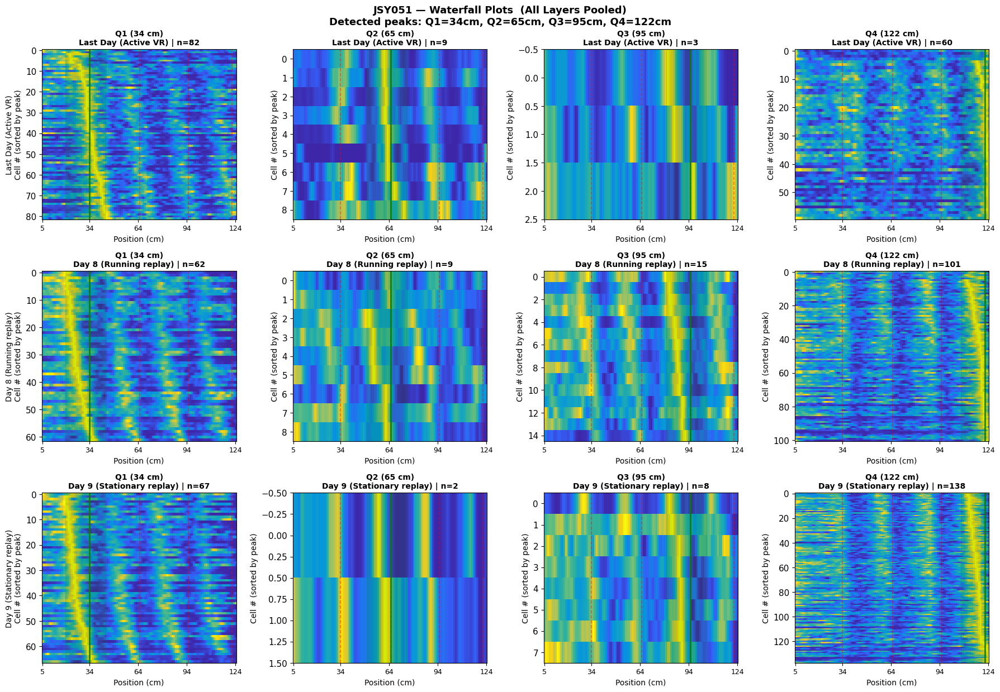

Saved: JSY052_waterfall_allLayers.pdf


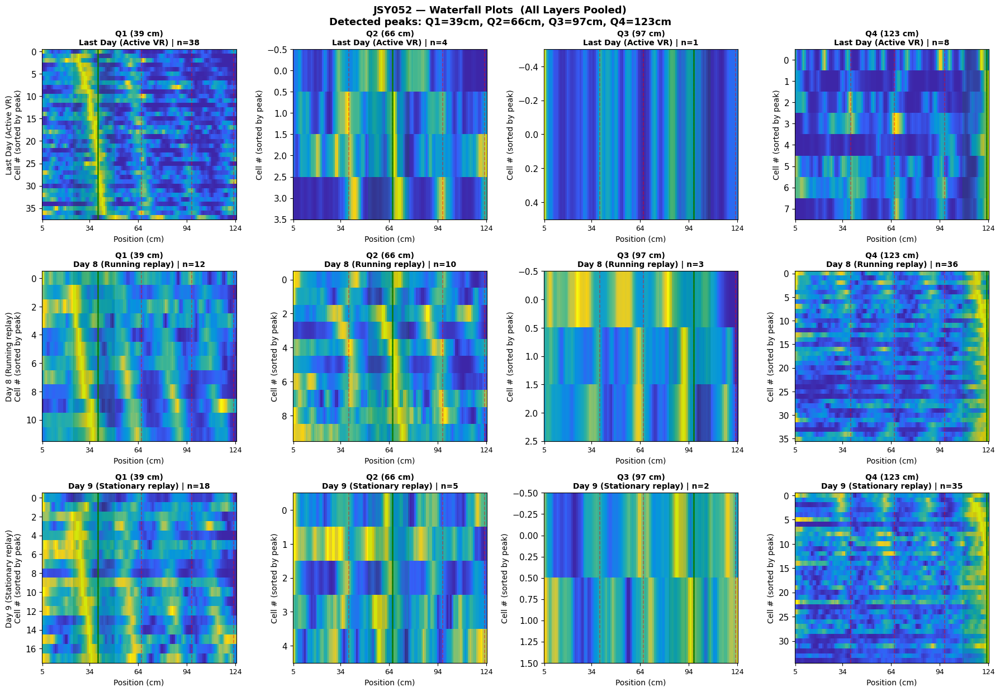

Saved: JSY054_waterfall_allLayers.pdf


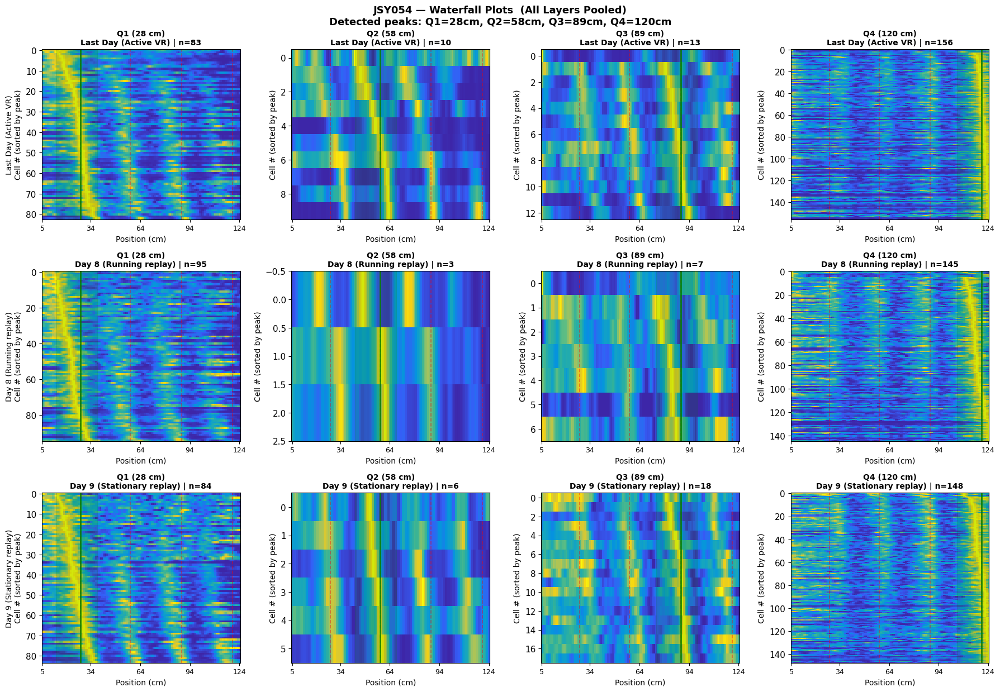

Saved: JSY055_waterfall_allLayers.pdf


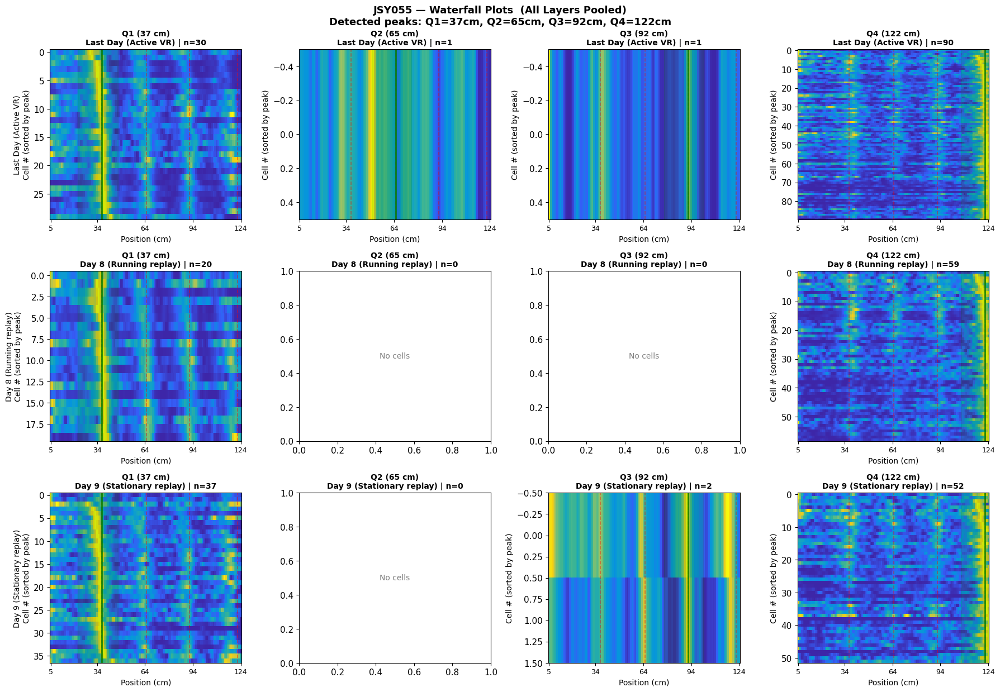

In [137]:
# ── Step 4b: All-layers waterfall plots (per animal) ──────────────────────────
# Layout: rows = conditions (3), cols = landmarks (4).
# Each panel: cells from ALL layers that prefer that landmark, sorted by peak.

for s in included_sessions:
    animal  = s['animal_id']
    out_dir = s['output_dir']
    if animal not in all_results:
        continue
    os.makedirs(out_dir, exist_ok=True)

    peaks_cm = DETECTED_PEAKS[animal]
    win_cfg  = ANIMAL_WINDOW_CONFIG[animal]

    fig, axes = plt.subplots(len(CONDITIONS), N_LANDMARKS,
                             figsize=(4.5 * N_LANDMARKS, 4.2 * len(CONDITIONS)))

    for ri, (cond, cond_label) in enumerate(zip(CONDITIONS, COND_LABELS)):
        raw = all_results[animal].get(cond, {}).get('_raw')
        if raw is None:
            for ax in axes[ri]:
                ax.text(0.5, 0.5, 'No data', ha='center', va='center',
                        transform=ax.transAxes, color='gray')
                ax.set_visible(True)
            continue

        lm_res      = raw['lm_res']
        bin_centers = raw['bin_centers']

        for qi in range(N_LANDMARKS):
            profiles = _get_lm_profiles(lm_res, None, qi)
            _draw_waterfall(axes[ri, qi], profiles, bin_centers,
                            peaks_cm, win_cfg, qi, cond_label)

        axes[ri, 0].set_ylabel(cond_label + '\nCell # (sorted by peak)', fontsize=10)

    peaks_str = ', '.join(f'Q{i+1}={p:.0f}cm' for i, p in enumerate(peaks_cm))
    fig.suptitle(f'{animal} — Waterfall Plots  (All Layers Pooled)\n'
                 f'Detected peaks: {peaks_str}',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    fig.savefig(os.path.join(out_dir, f'{animal}_waterfall_allLayers.pdf'),
                bbox_inches='tight')
    print(f'Saved: {animal}_waterfall_allLayers.pdf')
    plt.show()

Saved: JSY044_waterfall_L23.pdf


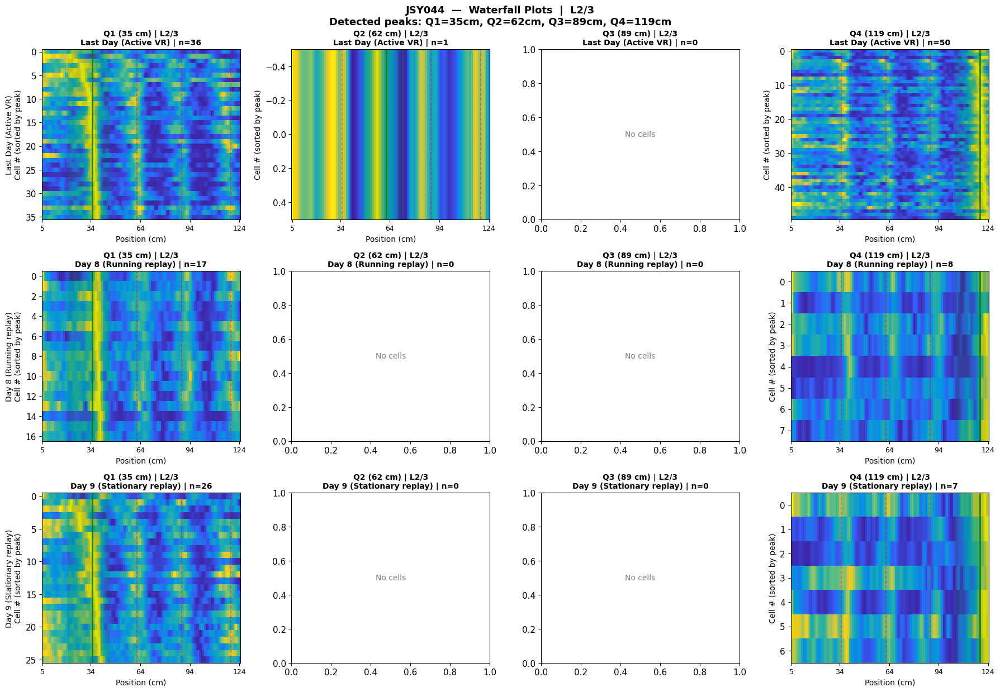

Saved: JSY044_waterfall_L4.pdf


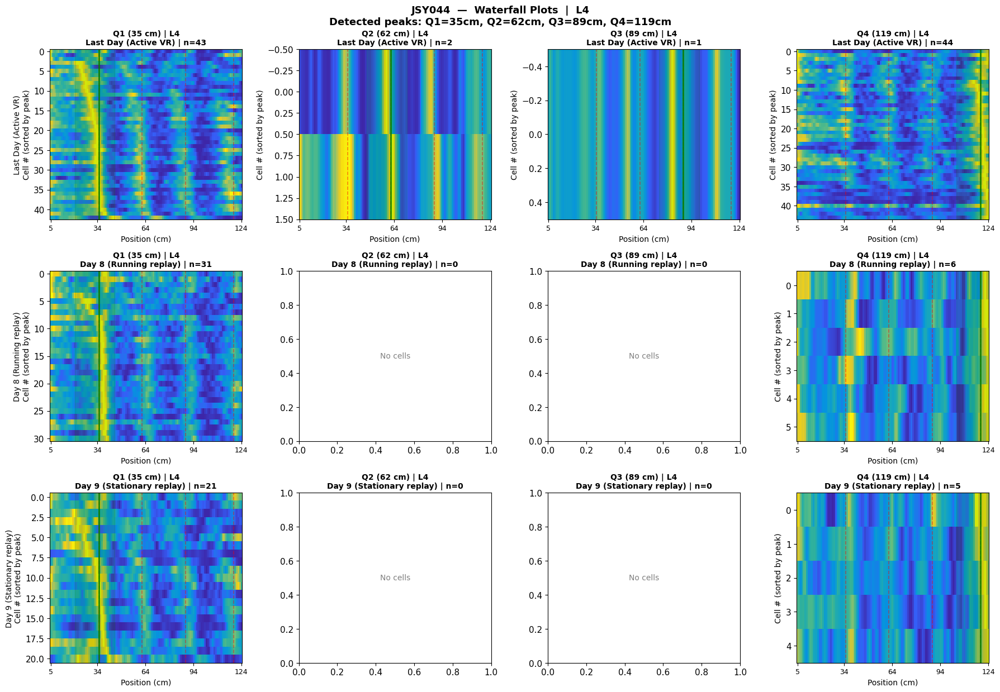

Saved: JSY044_waterfall_L5.pdf


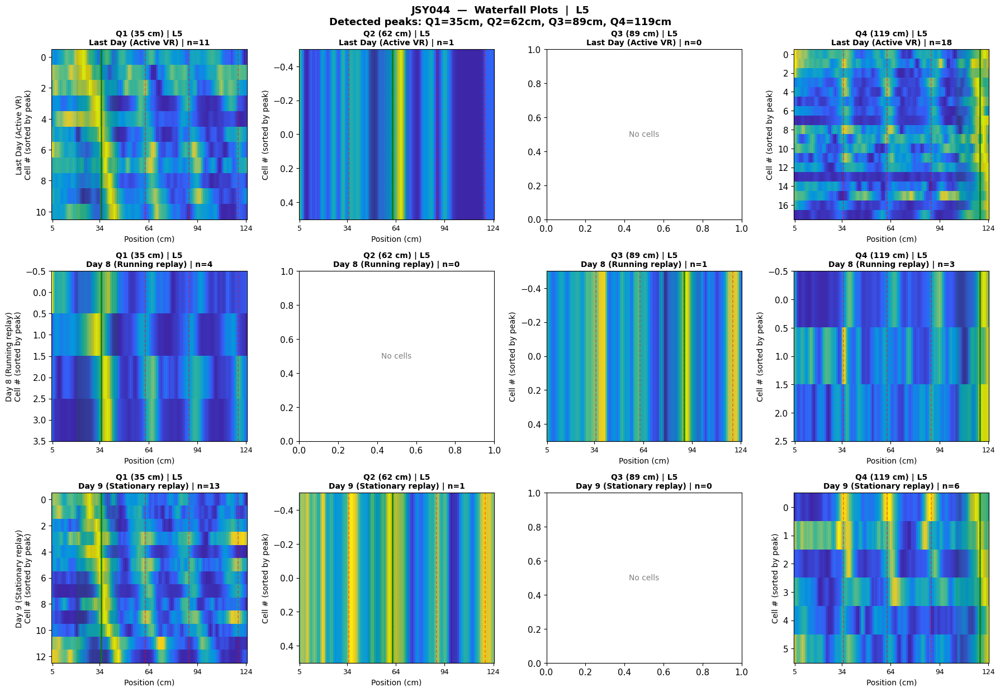

Saved: JSY044_waterfall_L6.pdf


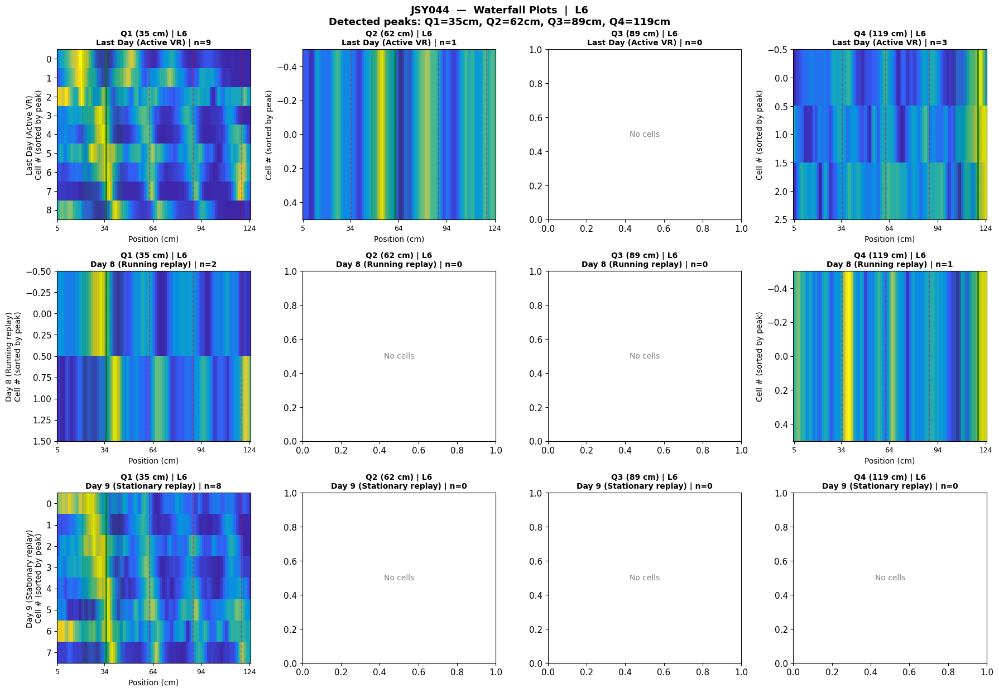

Saved: JSY051_waterfall_L23.pdf


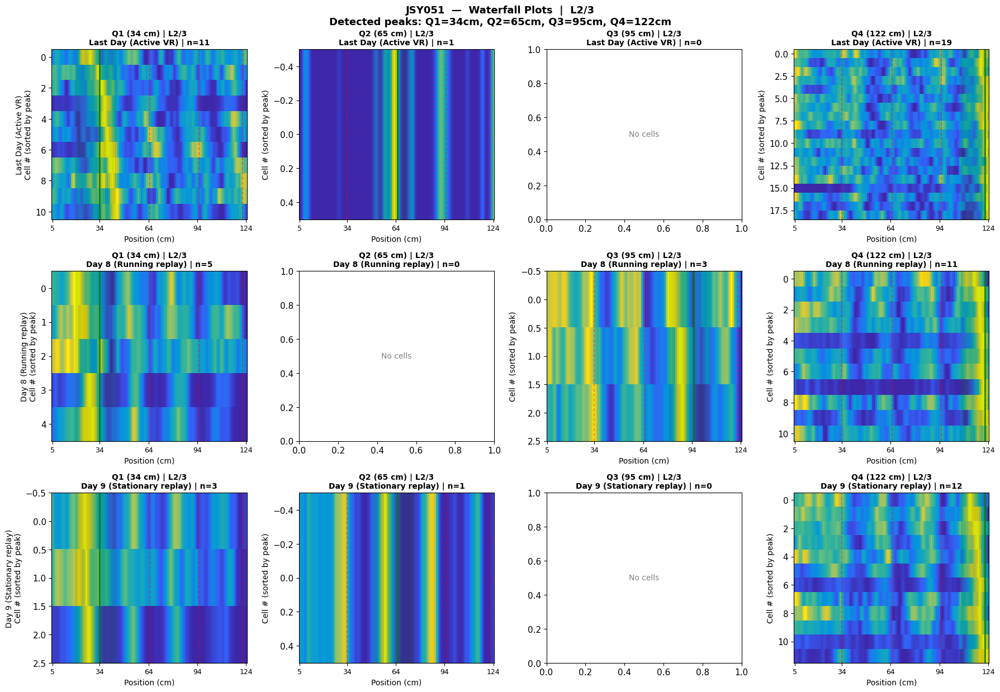

Saved: JSY051_waterfall_L4.pdf


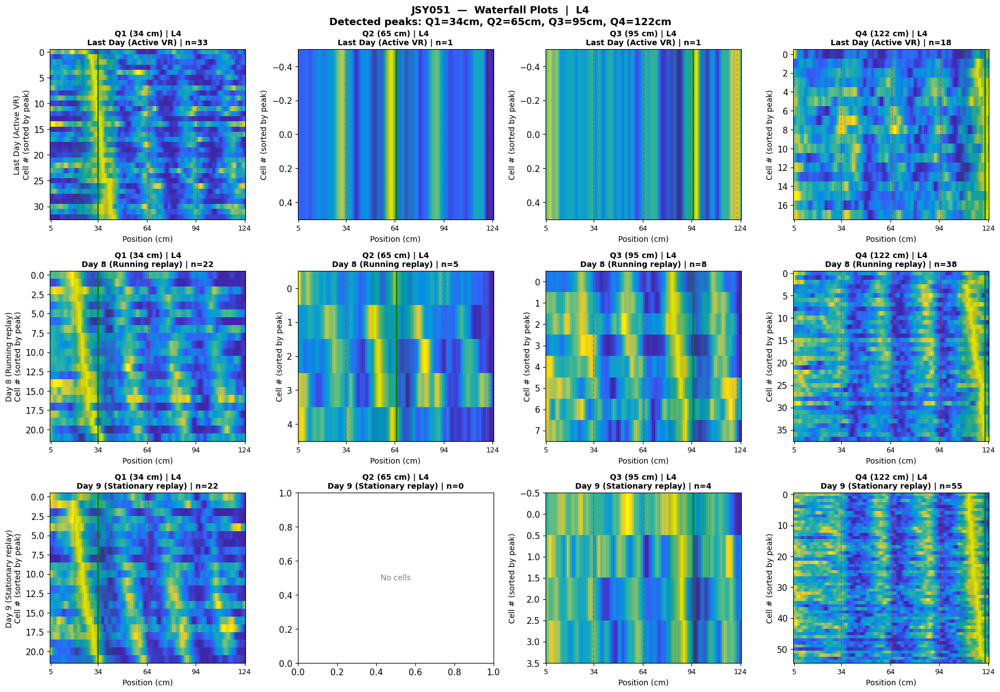

Saved: JSY051_waterfall_L5.pdf


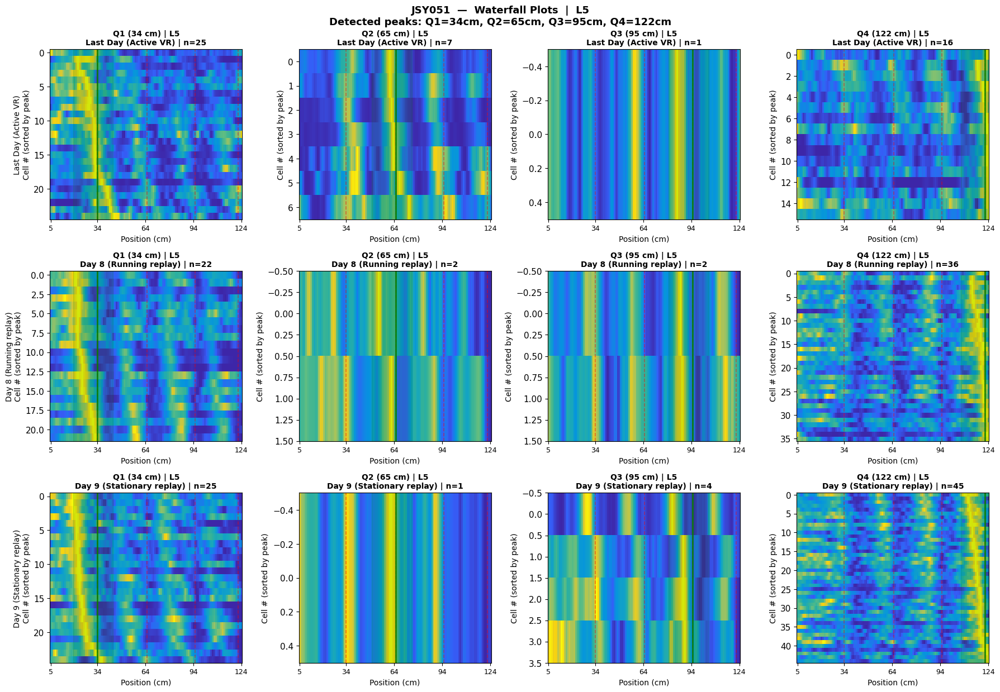

Saved: JSY051_waterfall_L6.pdf


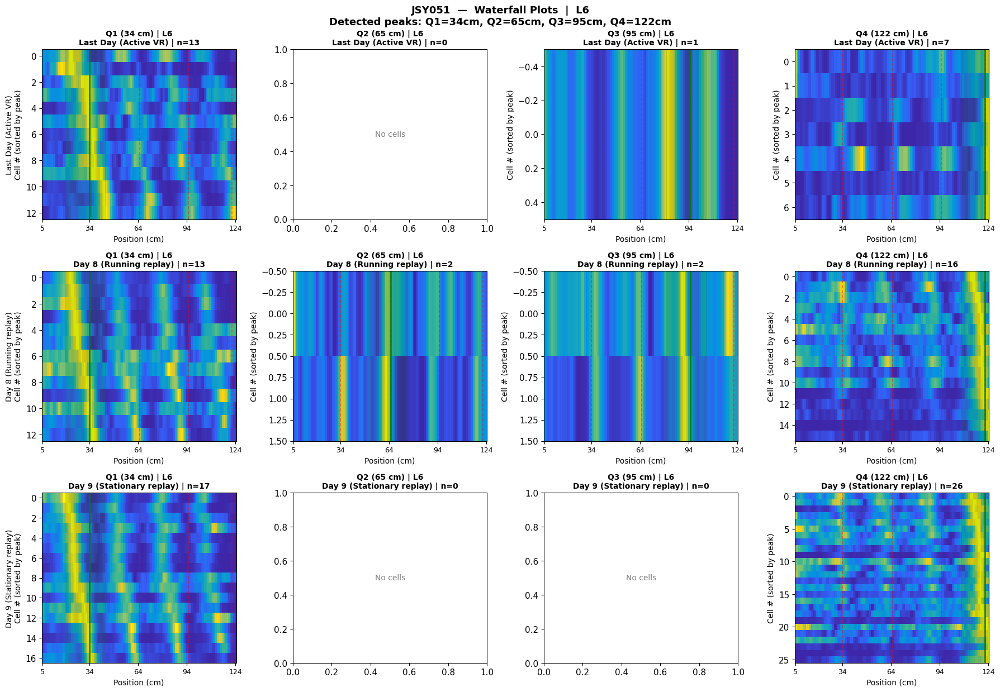

Saved: JSY052_waterfall_L23.pdf


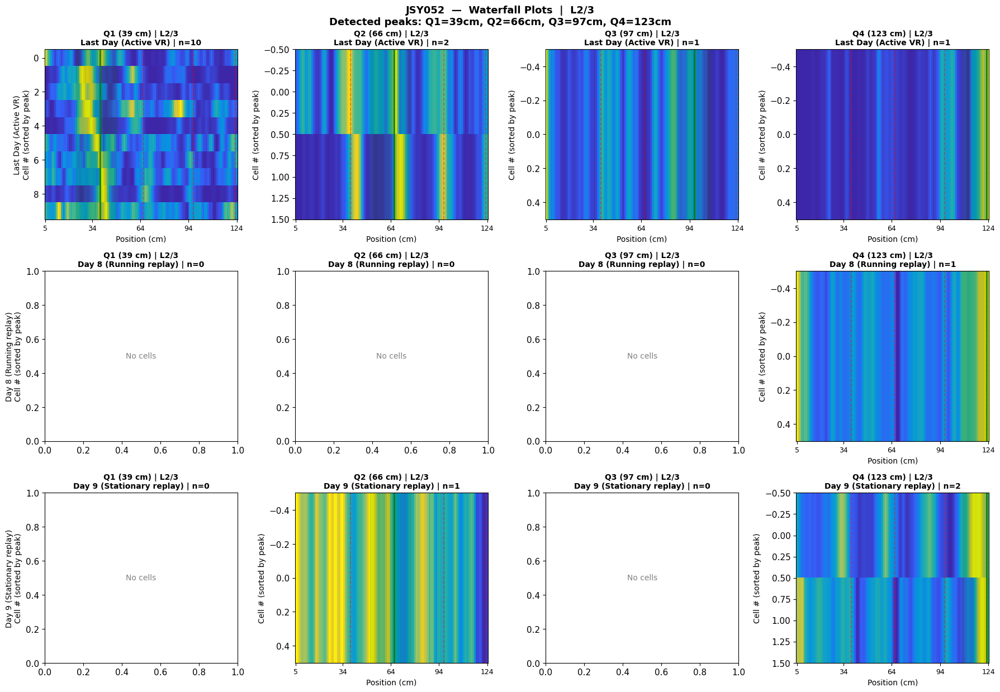

Saved: JSY052_waterfall_L4.pdf


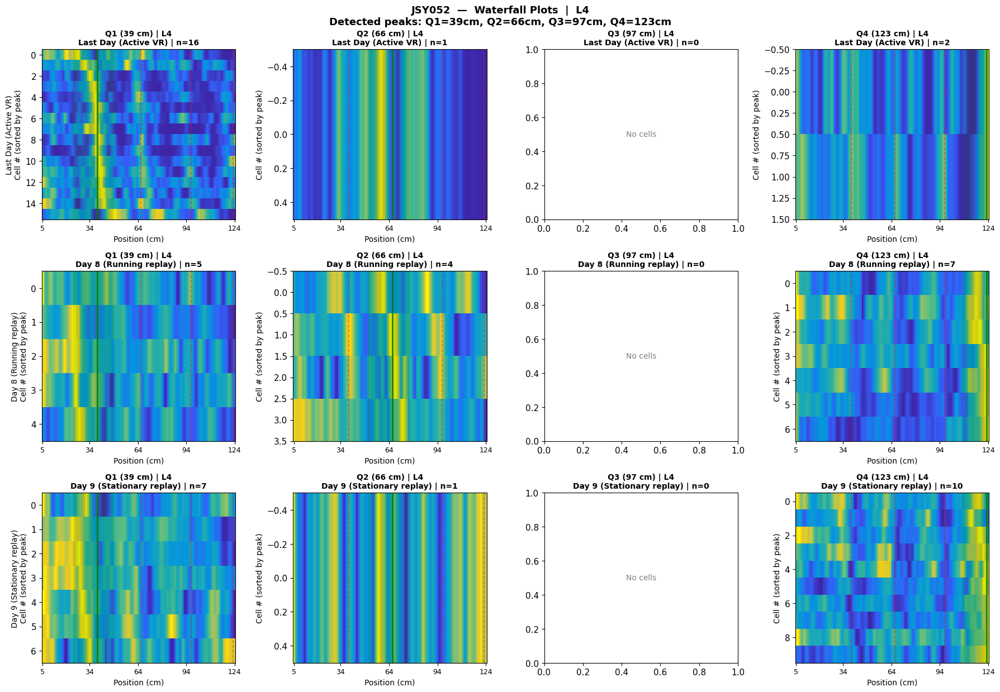

Saved: JSY052_waterfall_L5.pdf


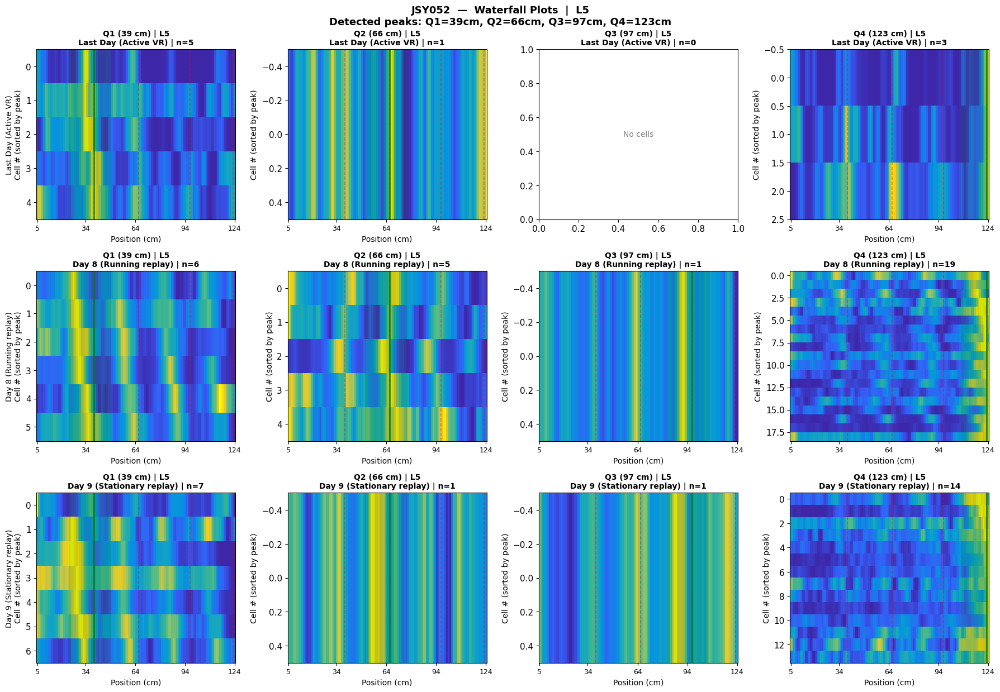

Saved: JSY052_waterfall_L6.pdf


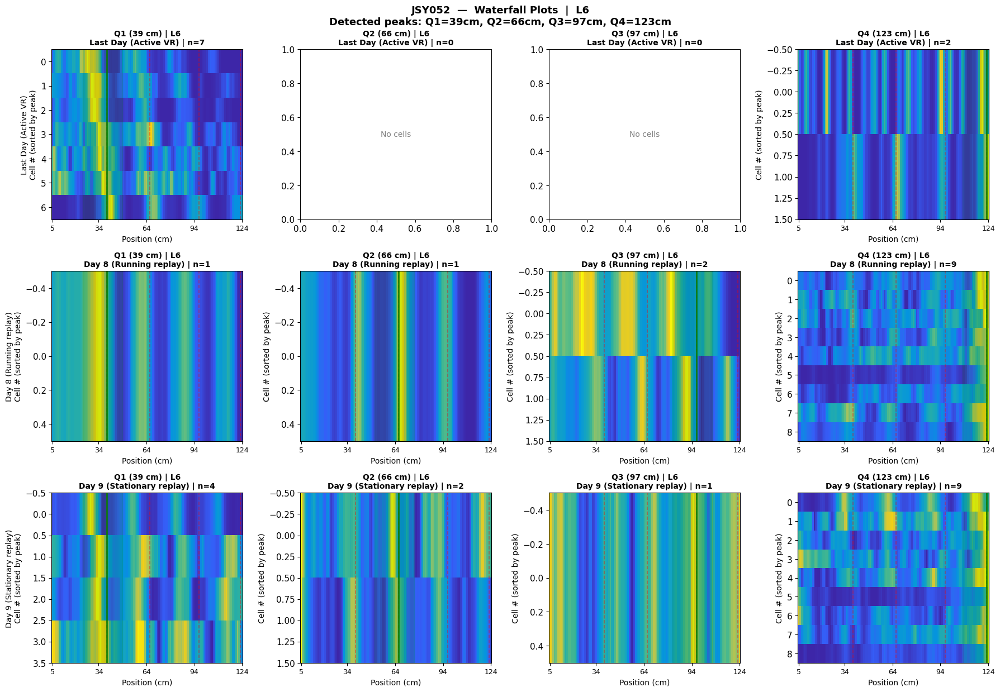

Saved: JSY054_waterfall_L23.pdf


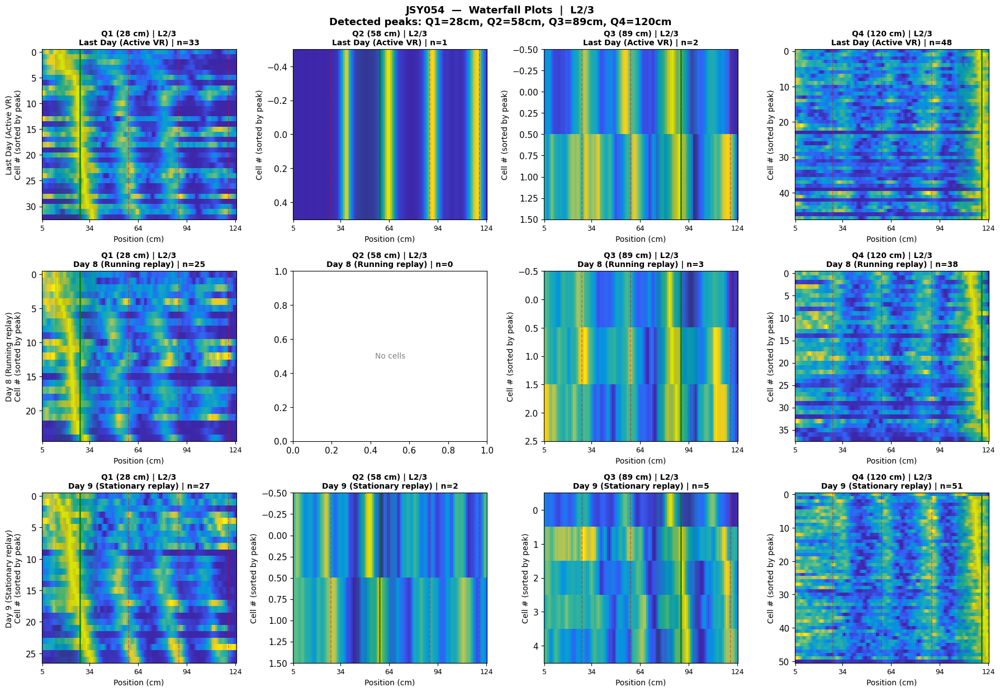

Saved: JSY054_waterfall_L4.pdf


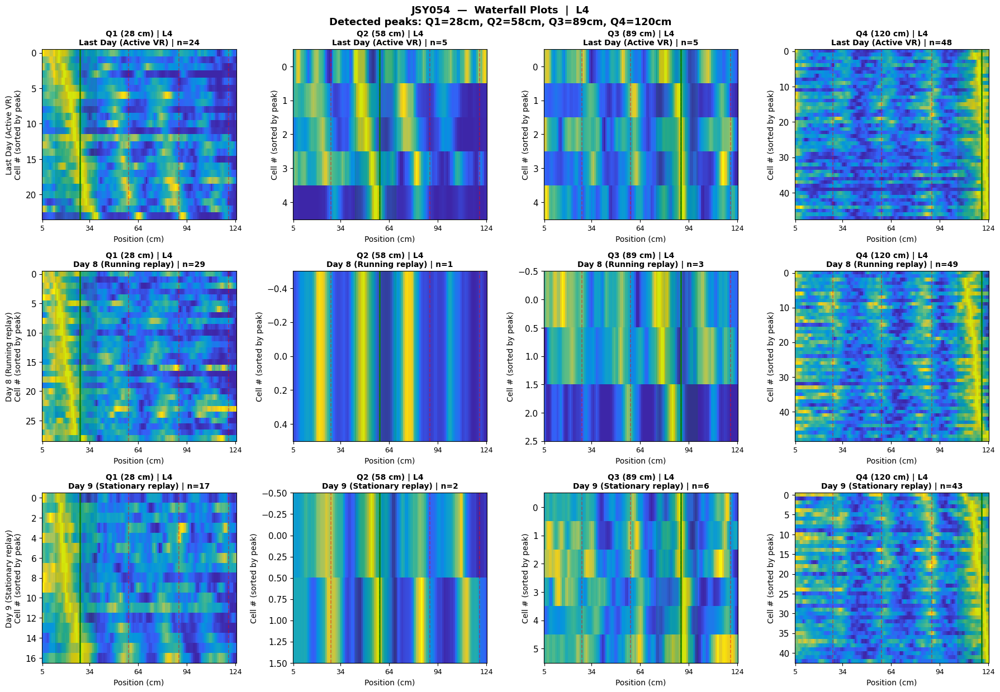

Saved: JSY054_waterfall_L5.pdf


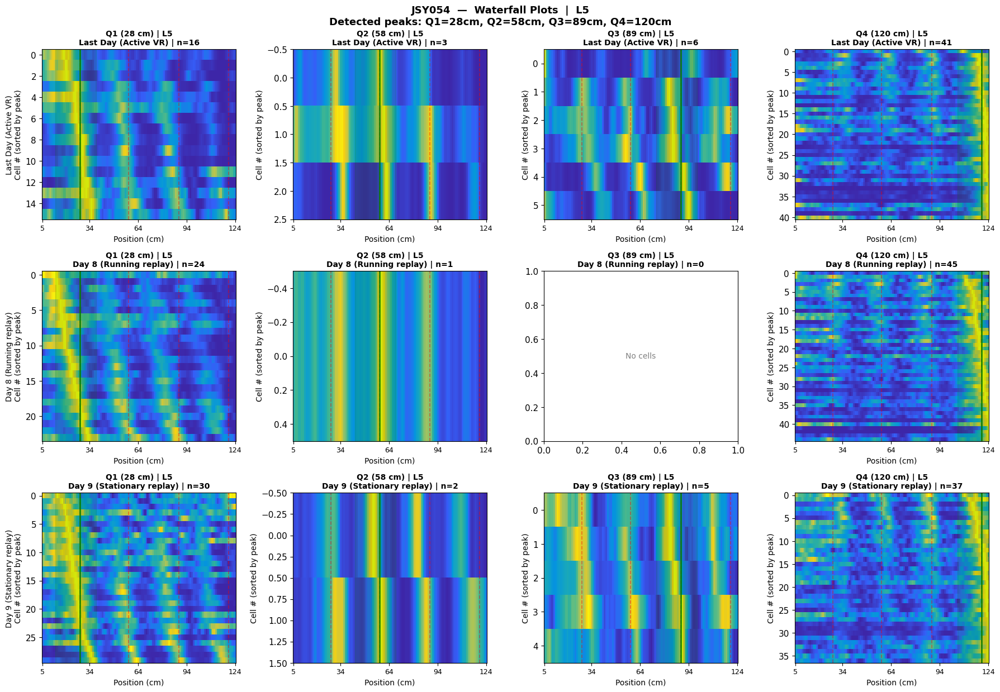

Saved: JSY054_waterfall_L6.pdf


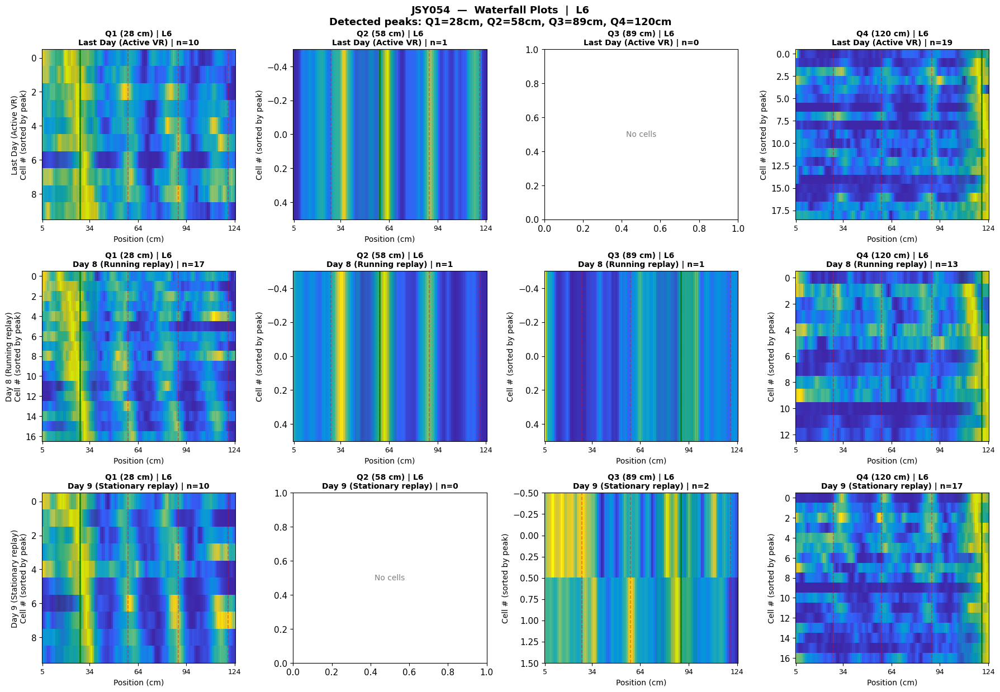

Saved: JSY055_waterfall_L23.pdf


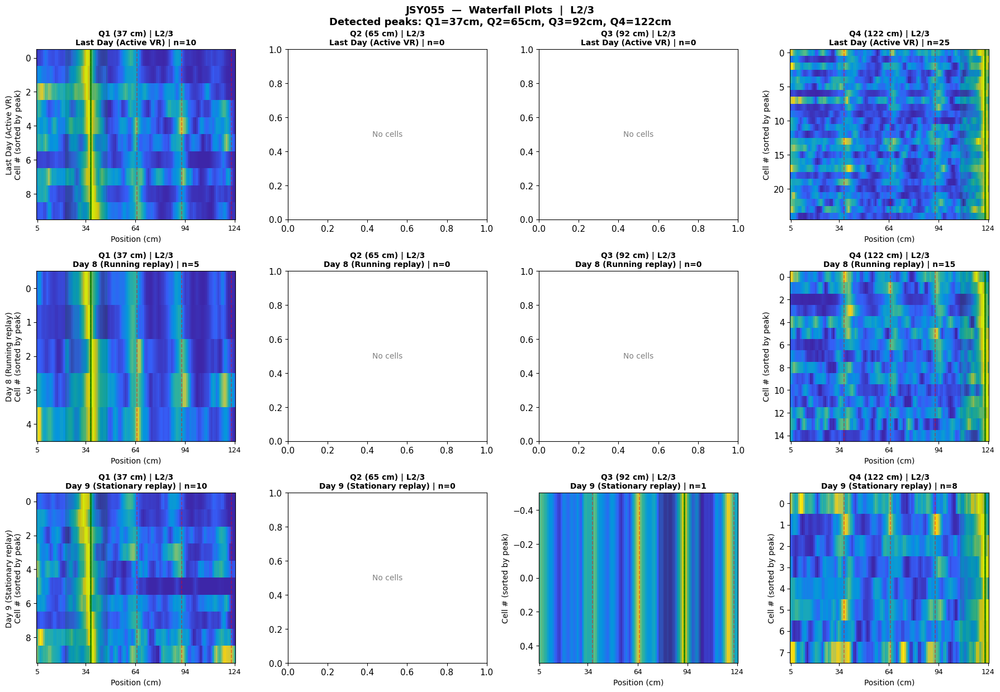

Saved: JSY055_waterfall_L4.pdf


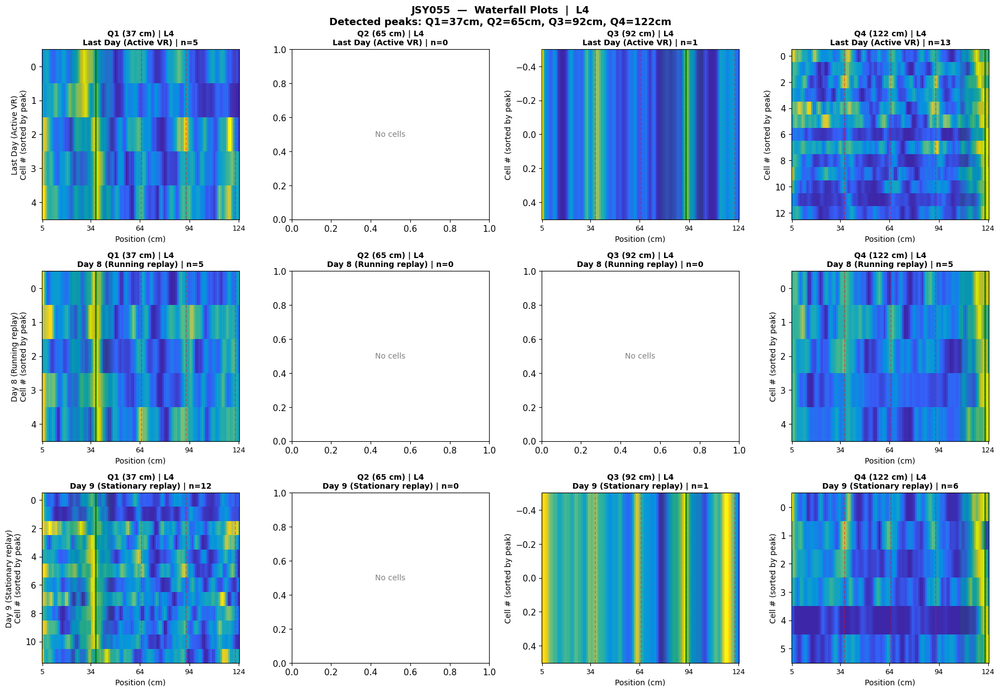

Saved: JSY055_waterfall_L5.pdf


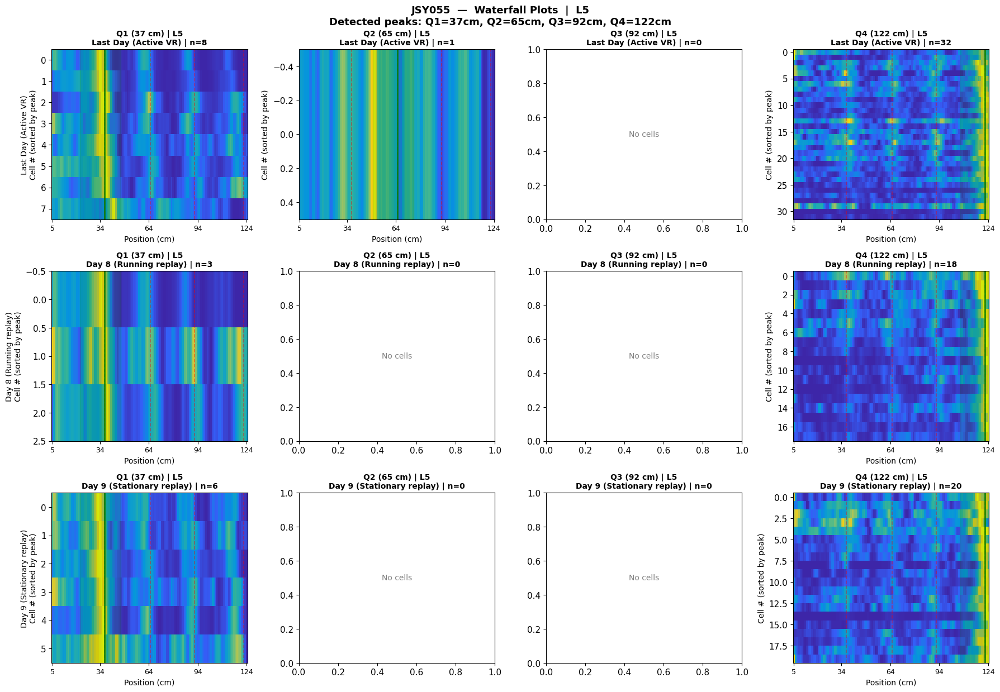

Saved: JSY055_waterfall_L6.pdf


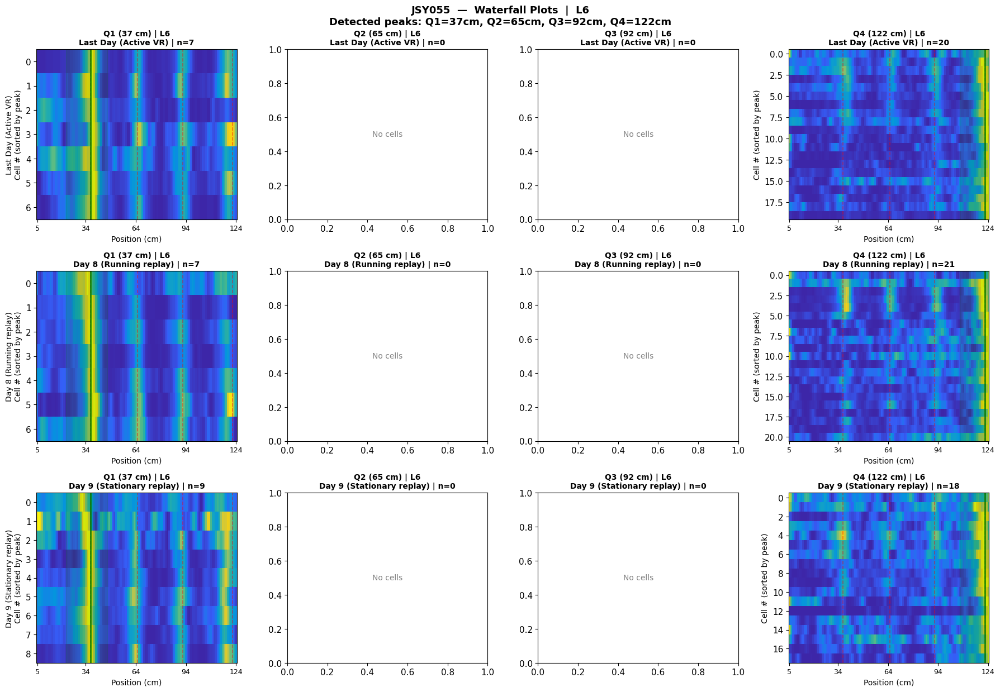

In [138]:
# ── Step 4c: Per-layer waterfall plots (per animal × layer) ───────────────────
# One figure per animal per layer.
# Layout: rows = conditions (3), cols = landmarks (4).
# Each panel: cells from THAT layer only that prefer that landmark.

for s in included_sessions:
    animal  = s['animal_id']
    out_dir = s['output_dir']
    if animal not in all_results:
        continue
    os.makedirs(out_dir, exist_ok=True)

    peaks_cm = DETECTED_PEAKS[animal]
    win_cfg  = ANIMAL_WINDOW_CONFIG[animal]

    for layer in LAYER_NAMES:
        fig, axes = plt.subplots(len(CONDITIONS), N_LANDMARKS,
                                 figsize=(4.5 * N_LANDMARKS, 4.2 * len(CONDITIONS)))

        for ri, (cond, cond_label) in enumerate(zip(CONDITIONS, COND_LABELS)):
            raw = all_results[animal].get(cond, {}).get('_raw')
            if raw is None:
                for ax in axes[ri]:
                    ax.text(0.5, 0.5, 'No data', ha='center', va='center',
                            transform=ax.transAxes, color='gray')
                continue

            lm_res      = raw['lm_res']
            bin_centers = raw['bin_centers']
            layer_cells = raw['layer_cells']
            layer_idx   = layer_cells.get(layer, np.array([], dtype=int))

            for qi in range(N_LANDMARKS):
                profiles = _get_lm_profiles(lm_res, layer_idx, qi)
                _draw_waterfall(axes[ri, qi], profiles, bin_centers,
                                peaks_cm, win_cfg, qi, cond_label, layer_label=layer)

            axes[ri, 0].set_ylabel(cond_label + '\nCell # (sorted by peak)', fontsize=10)

        layer_safe = layer.replace('/', '')
        peaks_str  = ', '.join(f'Q{i+1}={p:.0f}cm' for i, p in enumerate(peaks_cm))
        fig.suptitle(f'{animal}  —  Waterfall Plots  |  {layer}\n'
                     f'Detected peaks: {peaks_str}',
                     fontsize=13, fontweight='bold')
        plt.tight_layout()
        fig.savefig(os.path.join(out_dir, f'{animal}_waterfall_{layer_safe}.pdf'),
                    bbox_inches='tight')
        print(f'Saved: {animal}_waterfall_{layer_safe}.pdf')
        plt.show()

Saved: D:\V1_SpatialModulation\2p\V1_prism\JSY044_ChronicImaging\OpenLoopVR_Analysis\LandmarkPreference_DataDriven\LandmarkPref_DataDriven_JSY044.png


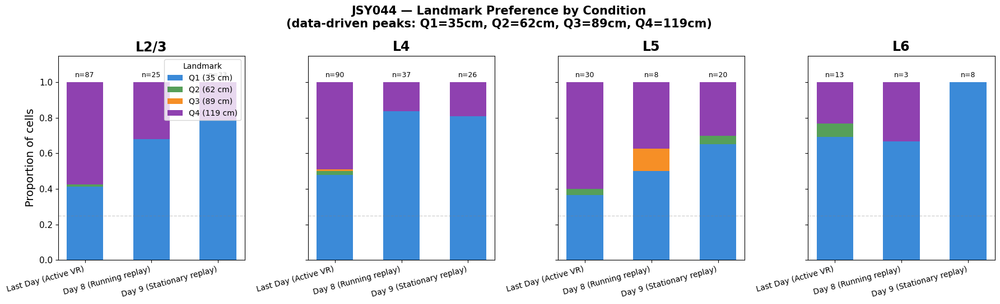

Saved: D:\V1_SpatialModulation\2p\V1_prism\JSY051_ChronicImaging\OpenLoopVR_Analysis\LandmarkPreference_DataDriven\LandmarkPref_DataDriven_JSY051.png


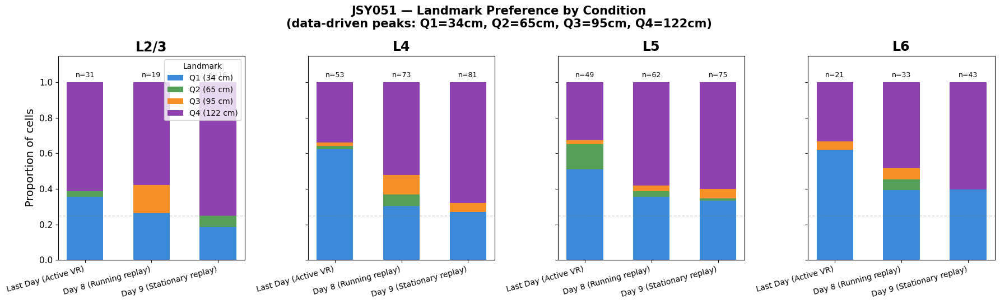

Saved: D:\V1_SpatialModulation\2p\V1_prism\JSY052_ChronicImaging\OpenLoopVR_Analysis\LandmarkPreference_DataDriven\LandmarkPref_DataDriven_JSY052.png


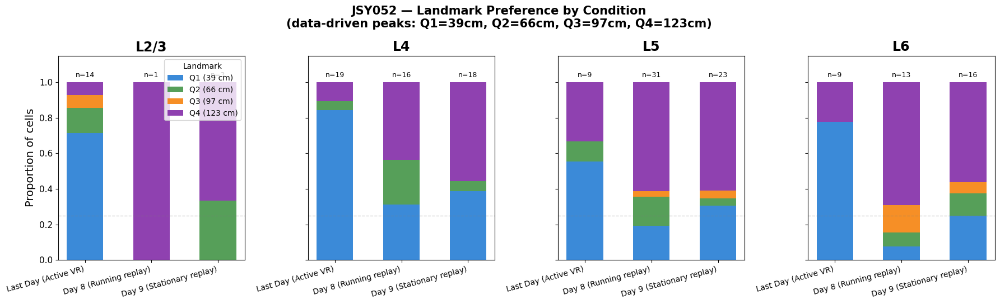

Saved: D:\V1_SpatialModulation\2p\V1_prism\JSY054_ChronicImaging\OpenLoopVR_Analysis\LandmarkPreference_DataDriven\LandmarkPref_DataDriven_JSY054.png


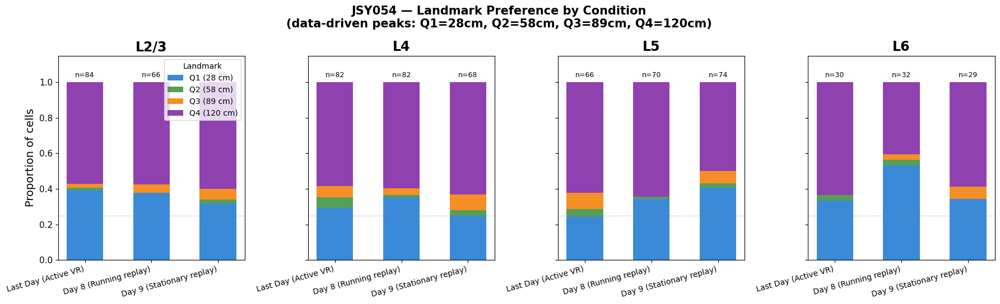

Saved: D:\V1_SpatialModulation\2p\V1_prism\JSY055_ChronicImaging\OpenLoopVR_Analysis\LandmarkPreference_DataDriven\LandmarkPref_DataDriven_JSY055.png


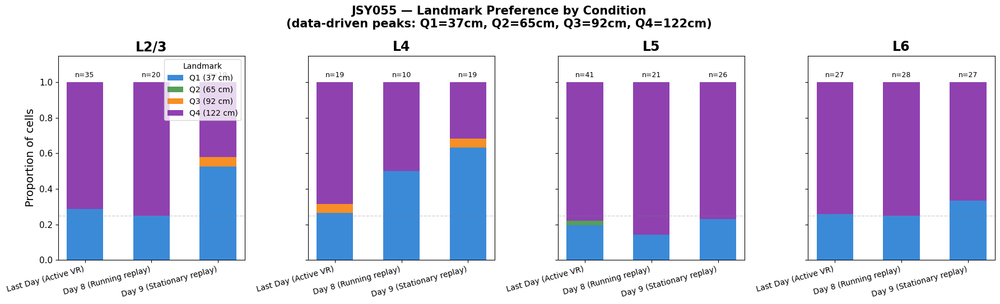

In [139]:
# ── Figure 1: Per-animal stacked bar comparison ───────────────────────────────
# One figure per animal. Panels = layers. X-axis = conditions. Stacked bars = landmarks.

for s in included_sessions:
    animal = s['animal_id']
    if animal not in all_results or animal not in DETECTED_PEAKS:
        continue
    peaks = DETECTED_PEAKS[animal]

    fig, axes = plt.subplots(1, len(LAYER_NAMES),
                              figsize=(4.5 * len(LAYER_NAMES), 5.5), sharey=True)
    x     = np.arange(len(CONDITIONS))
    bar_w = 0.55

    for ax, layer in zip(axes, LAYER_NAMES):
        for ci, cond in enumerate(CONDITIONS):
            cd     = all_results[animal].get(cond, {}).get(layer)
            bottom = 0.0
            for qi, (lm_color) in enumerate(LANDMARK_COLORS):
                if cd is None:
                    continue
                val   = float(cd['proportions'][qi])
                label = f'Q{qi+1} ({peaks[qi]:.0f} cm)' if ci == 0 else '_nolegend_'
                ax.bar(ci, val, bar_w, bottom=bottom,
                       color=lm_color, alpha=0.85, label=label)
                bottom += val
            if cd is not None:
                ax.text(ci, 1.02, f'n={cd["n_cells"]}',
                        ha='center', va='bottom', fontsize=9)

        ax.axhline(0.25, color='gray', lw=1, ls='--', alpha=0.35)
        ax.set_xticks(x)
        ax.set_xticklabels(COND_LABELS, fontsize=10, rotation=15, ha='right')
        ax.set_ylim(0, 1.15)
        ax.set_title(layer, fontsize=17, fontweight='bold')

    axes[0].set_ylabel('Proportion of cells', fontsize=14)
    axes[0].legend(loc='upper right', fontsize=10, title='Landmark', title_fontsize=10)

    peaks_str = ', '.join(f'Q{i+1}={p:.0f}cm' for i, p in enumerate(peaks))
    fig.suptitle(f'{animal} — Landmark Preference by Condition\n'
                 f'(data-driven peaks: {peaks_str})',
                 fontsize=15, fontweight='bold')
    plt.tight_layout()
    os.makedirs(s['output_dir'], exist_ok=True)
    save_path = os.path.join(s['output_dir'], f'LandmarkPref_DataDriven_{animal}.png')
    fig.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved: {save_path}')
    plt.show()

Saved: D:\V1_SpatialModulation\2p\V1_prism\across_animals_OpenLoopVR_Analysis\DataDriven_LandmarkPref_GroupedBar.png


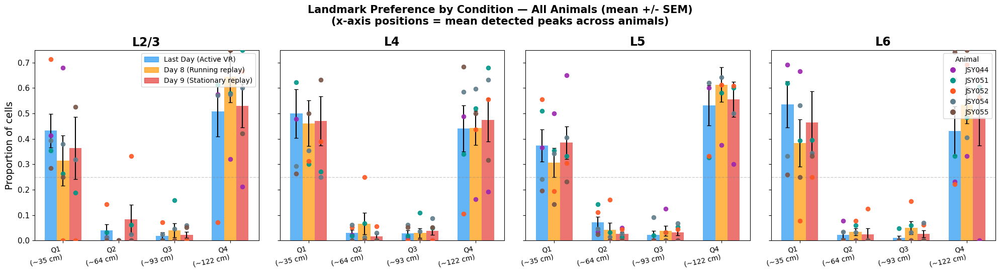

In [140]:
# ── Figure 2: Cross-animal grouped bar (mean +/- SEM, dots = animals) ─────────

fig, axes = plt.subplots(1, len(LAYER_NAMES),
                          figsize=(5 * len(LAYER_NAMES), 5.5), sharey=True)
n_cond = len(CONDITIONS)
bar_w  = 0.22
x      = np.arange(N_LANDMARKS)

for ax, layer in zip(axes, LAYER_NAMES):
    for ci, (cond, cond_label, cond_color) in enumerate(
            zip(CONDITIONS, COND_LABELS, COND_COLORS)):
        animal_props = []
        for animal in animals:
            cd = all_results[animal].get(cond, {}).get(layer)
            animal_props.append(cd['proportions'].copy() if cd else np.full(N_LANDMARKS, np.nan))
        animal_props = np.array(animal_props)

        n_valid = np.sum(~np.isnan(animal_props[:, 0]))
        mean_p  = np.nanmean(animal_props, axis=0)
        sem_p   = np.nanstd(animal_props, axis=0) / np.maximum(np.sqrt(n_valid), 1)
        offset  = (ci - (n_cond - 1) / 2) * bar_w

        ax.bar(x + offset, mean_p, bar_w, label=cond_label,
               color=cond_color, alpha=0.70,
               yerr=sem_p, capsize=3, error_kw={'lw': 1.5})
        for ai, (animal, ac) in enumerate(zip(animals, ANIMAL_COLORS)):
            ax.scatter(x + offset, animal_props[ai], s=35, color=ac, zorder=5, alpha=0.9)

    ax.axhline(0.25, color='gray', lw=1, ls='--', alpha=0.4)
    ax.set_xticks(x)
    ax.set_xticklabels(peak_labels, fontsize=10, rotation=12, ha='right')
    ax.set_ylim(0, 0.75)
    ax.set_title(layer, fontsize=17, fontweight='bold')

axes[0].set_ylabel('Proportion of cells', fontsize=14)

cond_handles = [plt.Rectangle((0, 0), 1, 1, color=c, alpha=0.7) for c in COND_COLORS]
axes[0].legend(cond_handles, COND_LABELS, fontsize=10, loc='upper right')

anim_handles = [Line2D([0], [0], marker='o', color='w',
                         markerfacecolor=c, markersize=9, label=a)
                for a, c in zip(animals, ANIMAL_COLORS)]
axes[-1].legend(handles=anim_handles, fontsize=10, title='Animal', loc='upper right')

fig.suptitle('Landmark Preference by Condition — All Animals (mean +/- SEM)\n'
             '(x-axis positions = mean detected peaks across animals)',
             fontsize=15, fontweight='bold')
plt.tight_layout()
save_path = os.path.join(ACROSS_ANIMALS_DIR, 'DataDriven_LandmarkPref_GroupedBar.png')
fig.savefig(save_path, dpi=150, bbox_inches='tight')
print(f'Saved: {save_path}')
plt.show()

Saved: D:\V1_SpatialModulation\2p\V1_prism\across_animals_OpenLoopVR_Analysis\DataDriven_LandmarkPref_Delta.png


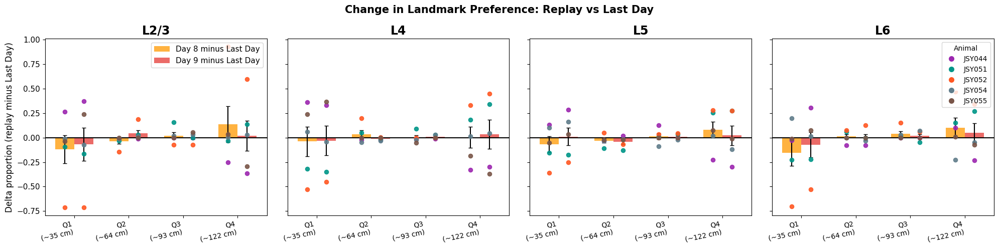

In [141]:
# ── Figure 3: Delta proportion (replay minus LastDay) ─────────────────────────

replay_conds  = ['OpenLoop_Moving', 'OpenLoop_Stationary']
replay_labels = ['Day 8 minus Last Day', 'Day 9 minus Last Day']
replay_colors = [COND_COLORS[1], COND_COLORS[2]]

fig, axes = plt.subplots(1, len(LAYER_NAMES),
                          figsize=(5 * len(LAYER_NAMES), 5), sharey=True)
bar_w = 0.35
x     = np.arange(N_LANDMARKS)

for ax, layer in zip(axes, LAYER_NAMES):
    for ci, (cond, label, color) in enumerate(
            zip(replay_conds, replay_labels, replay_colors)):
        deltas = []
        for animal in animals:
            last = all_results[animal].get('LastDay', {}).get(layer)
            rep  = all_results[animal].get(cond, {}).get(layer)
            if last is not None and rep is not None:
                deltas.append(rep['proportions'] - last['proportions'])
            else:
                deltas.append(np.full(N_LANDMARKS, np.nan))
        deltas  = np.array(deltas)
        n_valid = np.sum(~np.isnan(deltas[:, 0]))
        mean_d  = np.nanmean(deltas, axis=0)
        sem_d   = np.nanstd(deltas, axis=0) / np.maximum(np.sqrt(n_valid), 1)
        offset  = (ci - 0.5) * bar_w

        ax.bar(x + offset, mean_d, bar_w, label=label, color=color, alpha=0.75,
               yerr=sem_d, capsize=3, error_kw={'lw': 1.5})
        for ai, (animal, ac) in enumerate(zip(animals, ANIMAL_COLORS)):
            ax.scatter(x + offset, deltas[ai], s=35, color=ac, zorder=5, alpha=0.9)

    ax.axhline(0, color='k', lw=1.5)
    ax.set_title(layer, fontsize=17, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(peak_labels, fontsize=10, rotation=12, ha='right')

axes[0].set_ylabel('Delta proportion (replay minus Last Day)', fontsize=12)
axes[0].legend(fontsize=11, loc='upper right')

anim_handles = [Line2D([0], [0], marker='o', color='w',
                         markerfacecolor=c, markersize=9, label=a)
                for a, c in zip(animals, ANIMAL_COLORS)]
axes[-1].legend(handles=anim_handles, fontsize=10, title='Animal', loc='upper right')

fig.suptitle('Change in Landmark Preference: Replay vs Last Day',
             fontsize=15, fontweight='bold')
plt.tight_layout()
save_path = os.path.join(ACROSS_ANIMALS_DIR, 'DataDriven_LandmarkPref_Delta.png')
fig.savefig(save_path, dpi=150, bbox_inches='tight')
print(f'Saved: {save_path}')
plt.show()

Saved: D:\V1_SpatialModulation\2p\V1_prism\across_animals_OpenLoopVR_Analysis\DataDriven_Heatmap_AllLayers.png


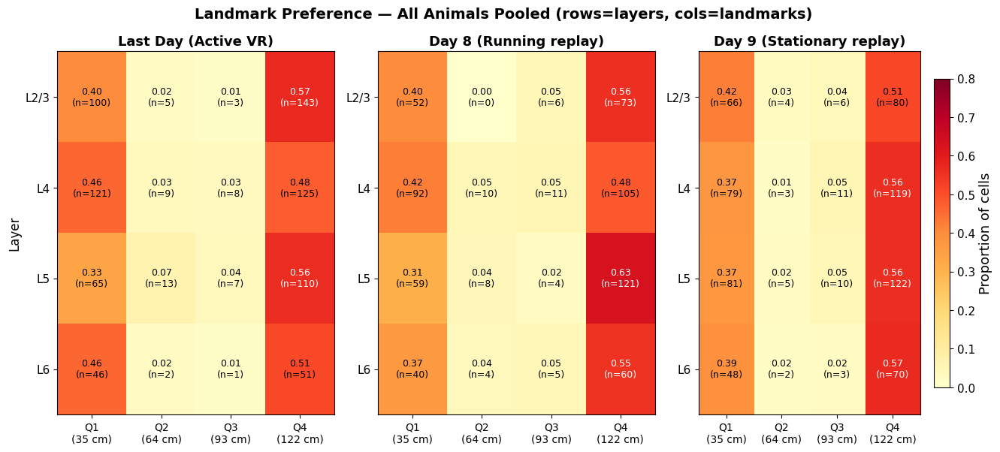

Saved: D:\V1_SpatialModulation\2p\V1_prism\across_animals_OpenLoopVR_Analysis\DataDriven_Heatmap_PerLayer.png


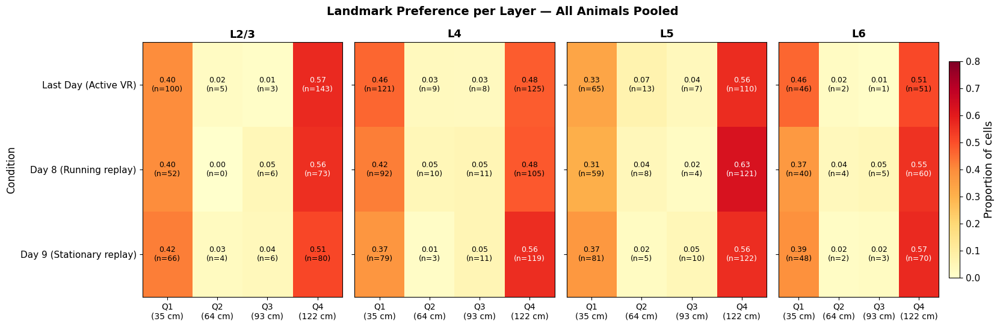

In [142]:
# ── Figure 4: Pooled heatmaps (all animals combined) ──────────────────────────

VMAX_HEAT  = 0.8
lm_xlabels = [f'Q{i+1}\n({p:.0f} cm)' for i, p in enumerate(mean_peaks)]


def _pool_heatmap_data(layer_list, cond):
    """Sum counts across animals for given layers and condition."""
    mat_prop  = np.full((len(layer_list), N_LANDMARKS), np.nan)
    mat_count = np.zeros((len(layer_list), N_LANDMARKS), dtype=int)
    for li, layer in enumerate(layer_list):
        total = np.zeros(N_LANDMARKS, dtype=int)
        for animal in animals:
            cd = all_results[animal].get(cond, {}).get(layer)
            if cd is not None:
                total += cd['counts']
        n = int(total.sum())
        if n > 0:
            mat_count[li] = total
            mat_prop[li]  = total / n
    return mat_prop, mat_count


def _draw_heatmap(ax, mat_prop, mat_count, row_labels, title):
    display = np.where(np.isnan(mat_prop), 0, mat_prop)
    im = ax.imshow(display, cmap='YlOrRd', aspect='auto', vmin=0, vmax=VMAX_HEAT)
    ax.set_xticks(np.arange(N_LANDMARKS))
    ax.set_xticklabels(lm_xlabels, fontsize=10)
    ax.set_yticks(np.arange(len(row_labels)))
    ax.set_yticklabels(row_labels, fontsize=11)
    ax.set_title(title, fontsize=13, fontweight='bold')
    for i in range(len(row_labels)):
        for j in range(N_LANDMARKS):
            val = mat_prop[i, j]
            if np.isnan(val):
                ax.text(j, i, '—', ha='center', va='center', fontsize=11, color='#AAAAAA')
            else:
                txt   = f'{val:.2f}\n(n={mat_count[i, j]})'
                color = 'white' if val > VMAX_HEAT * 0.65 else 'black'
                ax.text(j, i, txt, ha='center', va='center', fontsize=9, color=color)
    return im


# Plot A: per condition — rows = layers, cols = landmarks
fig, axes = plt.subplots(1, len(CONDITIONS),
                          figsize=(4.5 * len(CONDITIONS), 2.5 + 0.9 * len(LAYER_NAMES)))
for ax, cond, cond_label in zip(axes, CONDITIONS, COND_LABELS):
    mat_p, mat_c = _pool_heatmap_data(LAYER_NAMES, cond)
    im = _draw_heatmap(ax, mat_p, mat_c, LAYER_NAMES, cond_label)
axes[0].set_ylabel('Layer', fontsize=12)
plt.colorbar(im, ax=axes[-1], label='Proportion of cells', shrink=0.85)
fig.suptitle('Landmark Preference — All Animals Pooled (rows=layers, cols=landmarks)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
save_path = os.path.join(ACROSS_ANIMALS_DIR, 'DataDriven_Heatmap_AllLayers.png')
fig.savefig(save_path, dpi=150, bbox_inches='tight')
print(f'Saved: {save_path}')
plt.show()


# Plot B: per layer — rows = conditions, cols = landmarks
fig, axes = plt.subplots(1, len(LAYER_NAMES),
                          figsize=(4.2 * len(LAYER_NAMES), 2.5 + 1.0 * len(CONDITIONS)),
                          sharey=True)
for ax, layer in zip(axes, LAYER_NAMES):
    mat_p  = np.full((len(CONDITIONS), N_LANDMARKS), np.nan)
    mat_c  = np.zeros((len(CONDITIONS), N_LANDMARKS), dtype=int)
    for ci, cond in enumerate(CONDITIONS):
        total = np.zeros(N_LANDMARKS, dtype=int)
        for animal in animals:
            cd = all_results[animal].get(cond, {}).get(layer)
            if cd is not None:
                total += cd['counts']
        n = int(total.sum())
        if n > 0:
            mat_c[ci] = total
            mat_p[ci] = total / n
    im = _draw_heatmap(ax, mat_p, mat_c, COND_LABELS, layer)
axes[0].set_ylabel('Condition', fontsize=12)
plt.colorbar(im, ax=axes[-1], label='Proportion of cells', shrink=0.85)
fig.suptitle('Landmark Preference per Layer — All Animals Pooled',
             fontsize=14, fontweight='bold')
plt.tight_layout()
save_path = os.path.join(ACROSS_ANIMALS_DIR, 'DataDriven_Heatmap_PerLayer.png')
fig.savefig(save_path, dpi=150, bbox_inches='tight')
print(f'Saved: {save_path}')
plt.show()

In [143]:
# ── Statistics: chi-square per animal × layer (LastDay vs each replay) ────────

print('=' * 70)
print('CHI-SQUARE: LANDMARK DISTRIBUTION vs LAST DAY  (per animal, per layer)')
print('=' * 70)

for animal in animals:
    print(f'\n--- {animal}  (peaks: ' +
          ', '.join(f'Q{i+1}={p:.0f}cm' for i, p in enumerate(DETECTED_PEAKS[animal])) + ') ---')
    for layer in LAYER_NAMES:
        last_cd = all_results[animal].get('LastDay', {}).get(layer)
        if last_cd is None:
            continue
        print(f'  {layer}  LastDay counts: {last_cd["counts"]}  (n={last_cd["n_cells"]})')
        for cond, cond_label in zip(CONDITIONS[1:], COND_LABELS[1:]):
            rep_cd = all_results[animal].get(cond, {}).get(layer)
            if rep_cd is None:
                print(f'    vs {cond_label}: no data')
                continue
            table = np.array([last_cd['counts'], rep_cd['counts']])
            if table.min() < 1 or table.sum(axis=1).min() == 0:
                print(f'    vs {cond_label}: insufficient counts')
                continue
            chi2, p, dof, _ = chi2_contingency(table)
            sig = ('***' if p < 0.001 else '**' if p < 0.01
                   else '*' if p < 0.05 else 'ns')
            print(f'    vs {cond_label}: chi2={chi2:.3f}, dof={dof}, p={p:.4f}  {sig}')

CHI-SQUARE: LANDMARK DISTRIBUTION vs LAST DAY  (per animal, per layer)

--- JSY044  (peaks: Q1=35cm, Q2=62cm, Q3=89cm, Q4=119cm) ---
  L2/3  LastDay counts: [36  1  0 50]  (n=87)
    vs Day 8 (Running replay): insufficient counts
    vs Day 9 (Stationary replay): insufficient counts
  L4  LastDay counts: [43  2  1 44]  (n=90)
    vs Day 8 (Running replay): insufficient counts
    vs Day 9 (Stationary replay): insufficient counts
  L5  LastDay counts: [11  1  0 18]  (n=30)
    vs Day 8 (Running replay): insufficient counts
    vs Day 9 (Stationary replay): insufficient counts
  L6  LastDay counts: [9 1 0 3]  (n=13)
    vs Day 8 (Running replay): insufficient counts
    vs Day 9 (Stationary replay): insufficient counts

--- JSY051  (peaks: Q1=34cm, Q2=65cm, Q3=95cm, Q4=122cm) ---
  L2/3  LastDay counts: [11  1  0 19]  (n=31)
    vs Day 8 (Running replay): insufficient counts
    vs Day 9 (Stationary replay): insufficient counts
  L4  LastDay counts: [33  1  1 18]  (n=53)
    vs Day 8 (Ru

---
## Cross-Animal Combined Visualizations

Cells below pool data across all animals for a common view.

**Waterfall plots**: cells from all animals are concatenated. Because different animals have slightly different peak positions (the whole point of data-driven detection), the x-axis uses mean bin_centers across animals and the overlaid lines use mean detected peaks. The small inter-animal offset (≤10 cm) appears as slight spread within each panel — this is real variability, not an artefact.

**Bar graphs** (stacked, x = recording day): each bar shows the mean proportion across animals ± SEM, stacked by landmark. This puts "across days" on the x-axis so you can directly read off how the distribution shifts from Last Day → replay.

- **All layers pooled**: counts from L2/3, L4, L5, L6 summed per animal before averaging
- **Per layer**: separate subplot for each layer

In [144]:
# ── Cross-animal pooling helpers ──────────────────────────────────────────────

from scipy.interpolate import interp1d as _interp1d

_animals_with_peaks = [a for a in animals if a in DETECTED_PEAKS]

# Mean peaks and window config across all animals (used for overlay lines)
MEAN_PEAKS   = list(np.mean([DETECTED_PEAKS[a] for a in _animals_with_peaks], axis=0))
MEAN_WIN_CFG = [
    {
        'before': float(np.mean([ANIMAL_WINDOW_CONFIG[a][qi]['before']
                                  for a in _animals_with_peaks])),
        'after':  float(np.mean([ANIMAL_WINDOW_CONFIG[a][qi]['after']
                                  for a in _animals_with_peaks])),
    }
    for qi in range(N_LANDMARKS)
]

# Common bin_centers: from first available session (all should be the same length)
COMMON_BC = None
for a in _animals_with_peaks:
    for cond in CONDITIONS:
        raw = all_results.get(a, {}).get(cond, {}).get('_raw')
        if raw is not None:
            COMMON_BC = raw['bin_centers']
            break
    if COMMON_BC is not None:
        break


def _pool_cross_animal(cond, lm_idx, layer=None):
    """
    Concatenate mean_profiles across all animals for (cond, landmark, [layer]).
    Interpolates to COMMON_BC length if any animal has a different bin count.
    """
    n_target  = len(COMMON_BC)
    all_profs = []
    for animal in _animals_with_peaks:
        raw = all_results.get(animal, {}).get(cond, {}).get('_raw')
        if raw is None:
            continue
        lm_res      = raw['lm_res']
        bin_centers = raw['bin_centers']
        layer_cells = raw['layer_cells']
        layer_idx   = layer_cells.get(layer, np.array([], dtype=int)) if layer else None
        profs = _get_lm_profiles(lm_res, layer_idx, lm_idx)
        if len(profs) == 0:
            continue
        if profs.shape[1] != n_target:
            x_old = np.linspace(0, 1, profs.shape[1])
            x_new = np.linspace(0, 1, n_target)
            profs = np.array([_interp1d(x_old, p)(x_new) for p in profs])
        all_profs.append(profs)
    if not all_profs:
        return np.zeros((0, n_target))
    return np.concatenate(all_profs, axis=0)


def _per_animal_props_pooled_layers(cond):
    """Return array (n_animals, N_LANDMARKS) of proportions with all layers pooled."""
    props = []
    for animal in _animals_with_peaks:
        total = np.zeros(N_LANDMARKS, dtype=int)
        for layer in LAYER_NAMES:
            cd = all_results[animal].get(cond, {}).get(layer)
            if cd is not None:
                total += cd['counts']
        n = int(total.sum())
        props.append(total / n if n > 0 else np.full(N_LANDMARKS, np.nan))
    return np.array(props)


n_str = f'n={len(_animals_with_peaks)} animals: {", ".join(_animals_with_peaks)}'
print(f'Mean peaks: {", ".join(f"Q{i+1}={p:.1f}cm" for i, p in enumerate(MEAN_PEAKS))}')
print(f'Mean windows: {MEAN_WIN_CFG}')
print(n_str)

Mean peaks: Q1=35.1cm, Q2=63.7cm, Q3=92.9cm, Q4=121.7cm
Mean windows: [{'before': 15.0, 'after': 10.0}, {'before': 15.0, 'after': 10.0}, {'before': 15.0, 'after': 10.0}, {'before': 15.0, 'after': 10.0}]
n=5 animals: JSY044, JSY051, JSY052, JSY054, JSY055


Saved: DataDriven_Waterfall_CrossAnimal_AllLayers.pdf


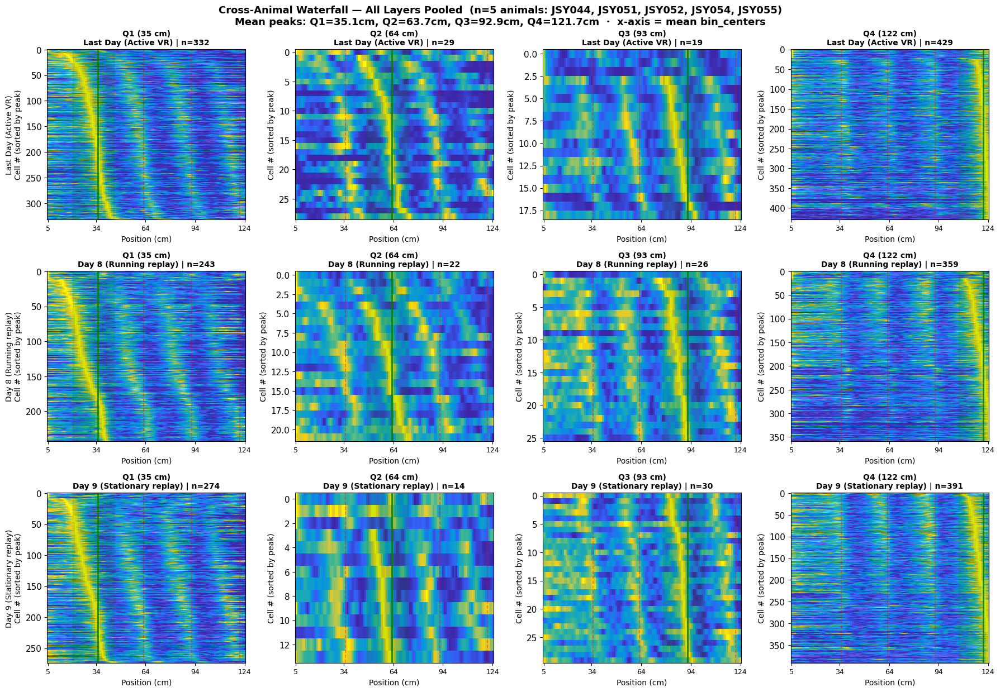

In [145]:
# ── Cross-animal waterfall — all layers pooled ────────────────────────────────
# Rows = conditions (3), cols = landmarks (4).
# Cells from all animals concatenated; x-axis uses mean bin_centers.

fig, axes = plt.subplots(len(CONDITIONS), N_LANDMARKS,
                         figsize=(4.5 * N_LANDMARKS, 4.2 * len(CONDITIONS)))

for ri, (cond, cond_label) in enumerate(zip(CONDITIONS, COND_LABELS)):
    for qi in range(N_LANDMARKS):
        profiles = _pool_cross_animal(cond, qi, layer=None)
        _draw_waterfall(axes[ri, qi], profiles, COMMON_BC,
                        MEAN_PEAKS, MEAN_WIN_CFG, qi, cond_label)
    axes[ri, 0].set_ylabel(cond_label + '\nCell # (sorted by peak)', fontsize=10)

peaks_str = ', '.join(f'Q{i+1}={p:.1f}cm' for i, p in enumerate(MEAN_PEAKS))
fig.suptitle(
    f'Cross-Animal Waterfall — All Layers Pooled  ({n_str})\n'
    f'Mean peaks: {peaks_str}  ·  x-axis = mean bin_centers',
    fontsize=13, fontweight='bold',
)
plt.tight_layout()
os.makedirs(ACROSS_ANIMALS_DIR, exist_ok=True)
fig.savefig(os.path.join(ACROSS_ANIMALS_DIR,
                         'DataDriven_Waterfall_CrossAnimal_AllLayers.pdf'),
            bbox_inches='tight')
print('Saved: DataDriven_Waterfall_CrossAnimal_AllLayers.pdf')
plt.show()

Saved: DataDriven_Waterfall_CrossAnimal_L23.pdf


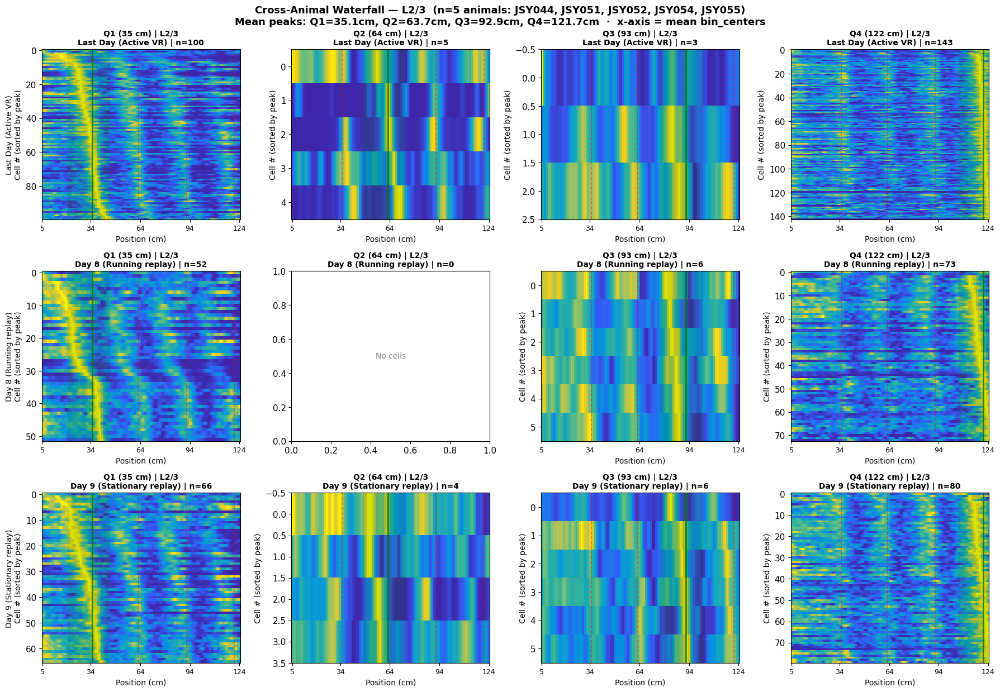

Saved: DataDriven_Waterfall_CrossAnimal_L4.pdf


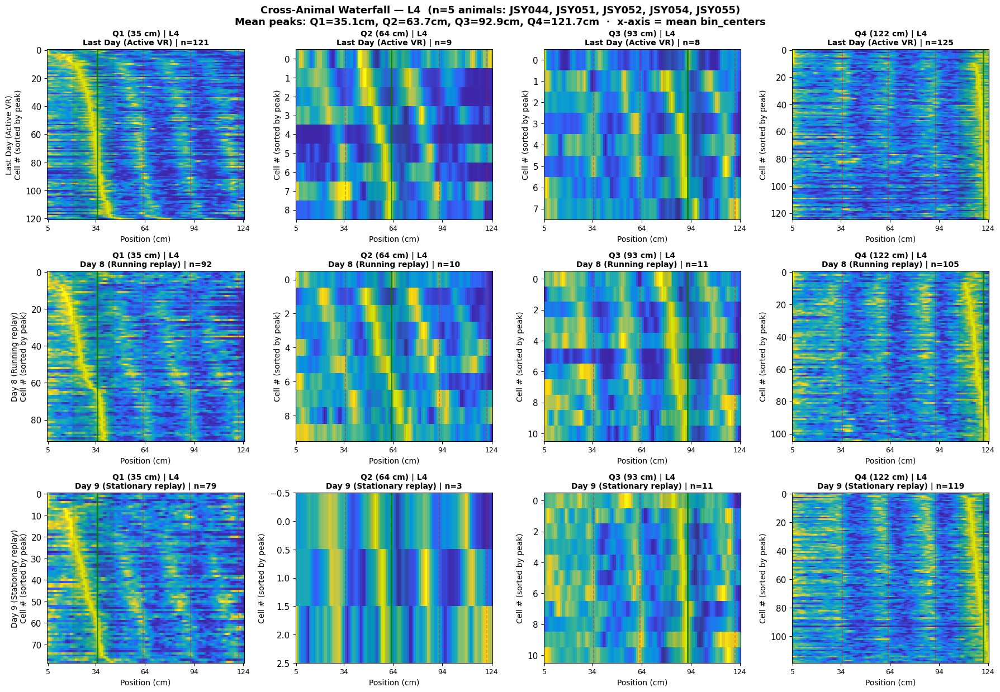

Saved: DataDriven_Waterfall_CrossAnimal_L5.pdf


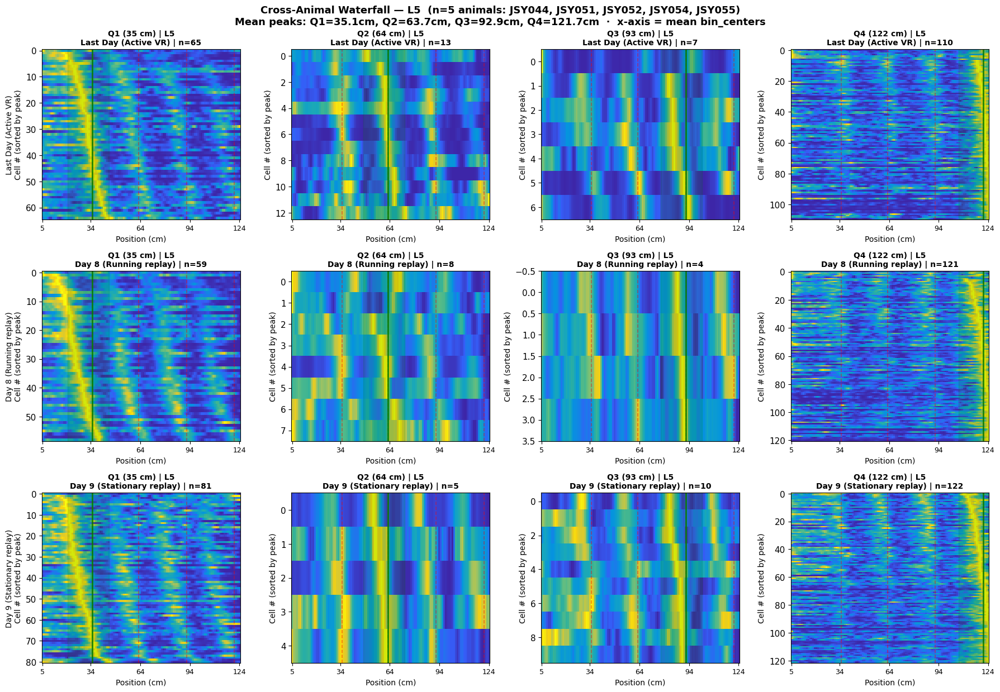

Saved: DataDriven_Waterfall_CrossAnimal_L6.pdf


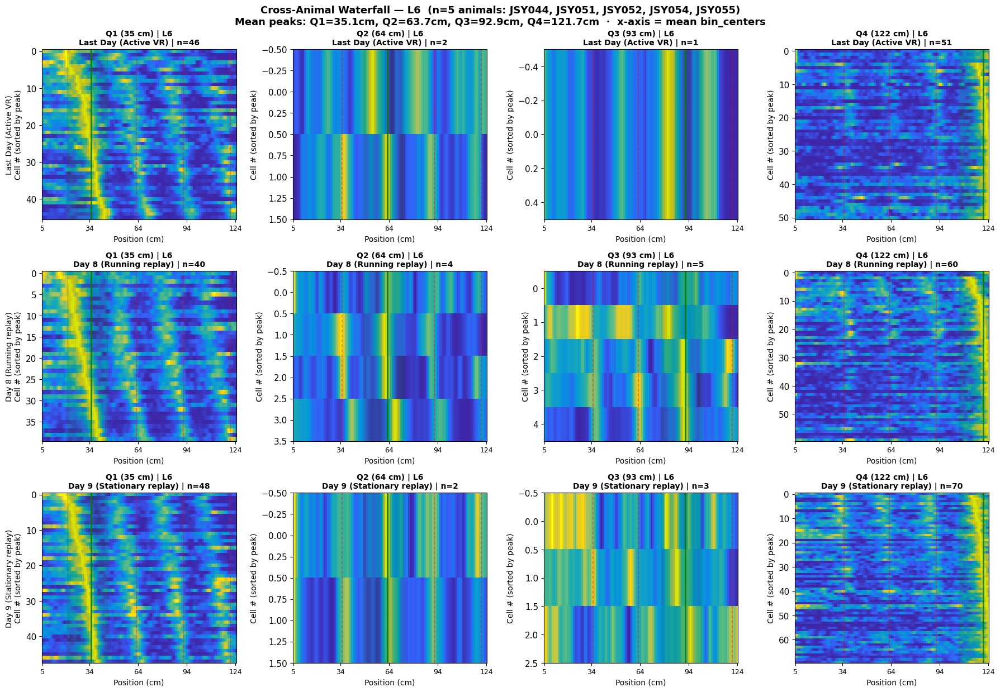

In [146]:
# ── Cross-animal waterfall — per layer ────────────────────────────────────────
# One figure per layer. Rows = conditions (3), cols = landmarks (4).

for layer in LAYER_NAMES:
    fig, axes = plt.subplots(len(CONDITIONS), N_LANDMARKS,
                             figsize=(4.5 * N_LANDMARKS, 4.2 * len(CONDITIONS)))

    for ri, (cond, cond_label) in enumerate(zip(CONDITIONS, COND_LABELS)):
        for qi in range(N_LANDMARKS):
            profiles = _pool_cross_animal(cond, qi, layer=layer)
            _draw_waterfall(axes[ri, qi], profiles, COMMON_BC,
                            MEAN_PEAKS, MEAN_WIN_CFG, qi, cond_label,
                            layer_label=layer)
        axes[ri, 0].set_ylabel(cond_label + '\nCell # (sorted by peak)', fontsize=10)

    layer_safe = layer.replace('/', '')
    fig.suptitle(
        f'Cross-Animal Waterfall — {layer}  ({n_str})\n'
        f'Mean peaks: {peaks_str}  ·  x-axis = mean bin_centers',
        fontsize=13, fontweight='bold',
    )
    plt.tight_layout()
    fig.savefig(os.path.join(ACROSS_ANIMALS_DIR,
                             f'DataDriven_Waterfall_CrossAnimal_{layer_safe}.pdf'),
                bbox_inches='tight')
    print(f'Saved: DataDriven_Waterfall_CrossAnimal_{layer_safe}.pdf')
    plt.show()

Saved: DataDriven_BarGraph_CrossAnimal_AllLayersPooled.pdf


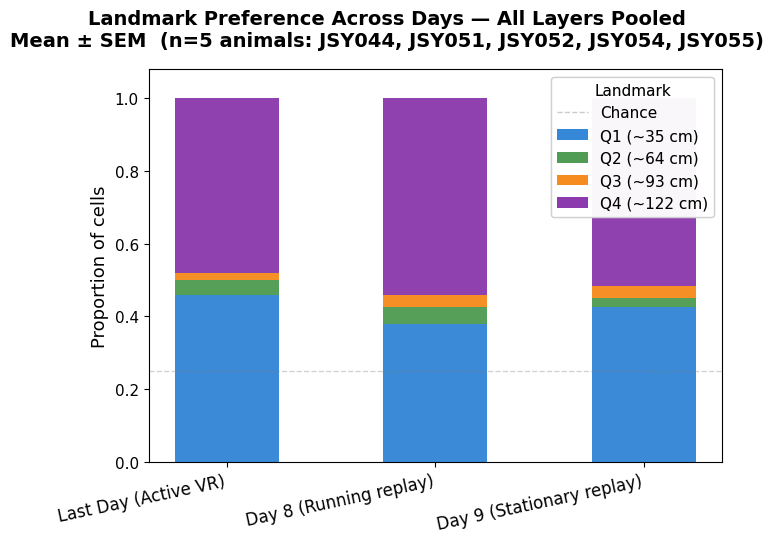

In [159]:
# ── Cross-animal bar graph — all layers pooled ────────────────────────────────
# Stacked bars: x = recording day (3), stacked by landmark (Q1-Q4).
# Each bar = mean proportion across animals. Error bars = SEM.
# Dots show individual animals on each landmark segment.

x     = np.arange(len(CONDITIONS))
bar_w = 0.5

fig, ax = plt.subplots(figsize=(7, 5.5))

for qi in range(N_LANDMARKS):
    props_per_cond = np.array([_per_animal_props_pooled_layers(cond)[:, qi]
                                for cond in CONDITIONS])   # (n_cond, n_animals)
    mean_p = np.nanmean(props_per_cond, axis=1)
    sem_p  = np.nanstd(props_per_cond, axis=1) / np.sqrt(np.sum(~np.isnan(props_per_cond), axis=1))
    bottom = np.array([np.nanmean(
                np.sum([_per_animal_props_pooled_layers(cond)[:, q]
                        for q in range(qi)], axis=0))
                for cond in CONDITIONS]) if qi > 0 else np.zeros(len(CONDITIONS))

    ax.bar(x, mean_p, bar_w, bottom=bottom,
           color=LANDMARK_COLORS[qi], alpha=0.85,
           label=f'Q{qi+1} (~{MEAN_PEAKS[qi]:.0f} cm)')

    # # SEM error bars centred on each bar segment
    # ax.errorbar(x, bottom + mean_p / 2, yerr=sem_p / 2,
    #             fmt='none', color=LANDMARK_COLORS[qi],
    #             ecolor='black', elinewidth=1.2, capsize=3, alpha=0.6)

    # # Animal dots
    # for ci, cond in enumerate(CONDITIONS):
    #     seg_bottoms = np.array([
    #         np.nansum([_per_animal_props_pooled_layers(cond)[ai, q]
    #                    for q in range(qi)])
    #         for ai in range(len(_animals_with_peaks))
    #     ])
    #     seg_vals = _per_animal_props_pooled_layers(cond)[:, qi]
    #     for ai, (ac, bval, sval) in enumerate(
    #             zip(ANIMAL_COLORS[:len(_animals_with_peaks)], seg_bottoms, seg_vals)):
    #         if not np.isnan(sval):
    #             ax.scatter(ci, bval + sval / 2, s=28, color=ac, zorder=6, alpha=0.85)

ax.axhline(0.25, color='gray', lw=1, ls='--', alpha=0.35, label='Chance')
ax.set_xticks(x)
ax.set_xticklabels(COND_LABELS, fontsize=12, rotation=12, ha='right')
ax.set_ylim(0, 1.08)
ax.set_ylabel('Proportion of cells', fontsize=13)
ax.legend(loc='upper right', fontsize=11, title='Landmark', title_fontsize=11)

anim_handles = [Line2D([0], [0], marker='o', color='w',
                         markerfacecolor=c, markersize=9, label=a)
                for a, c in zip(_animals_with_peaks, ANIMAL_COLORS)]
ax.add_artist(ax.legend(loc='upper right', fontsize=11,
                         title='Landmark', title_fontsize=11))
# fig.legend(handles=anim_handles, fontsize=10, title='Animal', title_fontsize=10,
#            loc='center right', bbox_to_anchor=(1.15, 0.5))

fig.suptitle(f'Landmark Preference Across Days — All Layers Pooled\n'
             f'Mean ± SEM  ({n_str})',
             fontsize=14, fontweight='bold')
plt.tight_layout()
fig.savefig(os.path.join(ACROSS_ANIMALS_DIR,
                         'DataDriven_BarGraph_CrossAnimal_AllLayersPooled.pdf'),
            bbox_inches='tight')
print('Saved: DataDriven_BarGraph_CrossAnimal_AllLayersPooled.pdf')
plt.show()

Saved: DataDriven_BarGraph_CrossAnimal_PerLayer.pdf


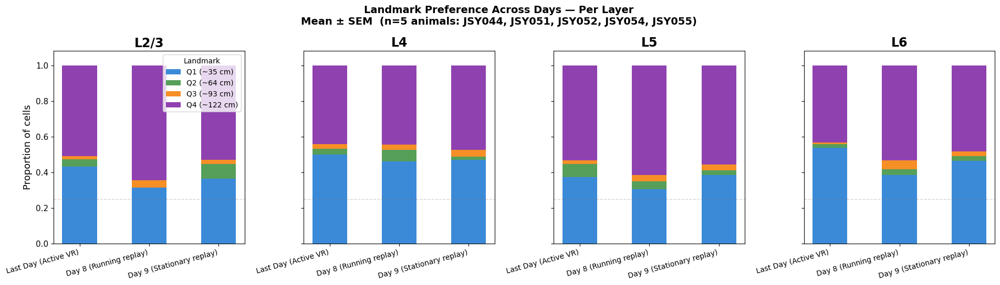

In [161]:
# ── Cross-animal bar graph — per layer ───────────────────────────────────────
# 4 subplots (one per layer). Each: stacked bars, x = recording day.
# Same format as the all-layers plot above, broken out per layer.

fig, axes = plt.subplots(1, len(LAYER_NAMES),
                          figsize=(4.8 * len(LAYER_NAMES), 5.5), sharey=True)
x     = np.arange(len(CONDITIONS))
bar_w = 0.5

for ax, layer in zip(axes, LAYER_NAMES):
    for qi in range(N_LANDMARKS):
        # Per-animal proportions for this layer × landmark × condition
        props_per_cond = []
        for cond in CONDITIONS:
            a_props = []
            for animal in _animals_with_peaks:
                cd = all_results[animal].get(cond, {}).get(layer)
                if cd is not None:
                    a_props.append(float(cd['proportions'][qi]))
                else:
                    a_props.append(np.nan)
            props_per_cond.append(a_props)
        props_per_cond = np.array(props_per_cond)   # (n_cond, n_animals)

        n_valid = np.sum(~np.isnan(props_per_cond), axis=1)
        mean_p  = np.nanmean(props_per_cond, axis=1)
        sem_p   = np.nanstd(props_per_cond, axis=1) / np.maximum(np.sqrt(n_valid), 1)

        # Bottom = sum of mean proportions for Q0..Q(qi-1)
        if qi == 0:
            bottom = np.zeros(len(CONDITIONS))
        else:
            prev = []
            for q in range(qi):
                p_prev = []
                for cond in CONDITIONS:
                    cond_p = []
                    for animal in _animals_with_peaks:
                        cd = all_results[animal].get(cond, {}).get(layer)
                        cond_p.append(float(cd['proportions'][q]) if cd else np.nan)
                    p_prev.append(np.nanmean(cond_p))
                prev.append(p_prev)
            bottom = np.sum(prev, axis=0)

        ax.bar(x, mean_p, bar_w, bottom=bottom,
               color=LANDMARK_COLORS[qi], alpha=0.85,
               label=f'Q{qi+1} (~{MEAN_PEAKS[qi]:.0f} cm)')
        # ax.errorbar(x, bottom + mean_p / 2, yerr=sem_p / 2,
        #             fmt='none', ecolor='black', elinewidth=1.2, capsize=3, alpha=0.6)

        # for ci, cond in enumerate(CONDITIONS):
        #     for ai, ac in enumerate(ANIMAL_COLORS[:len(_animals_with_peaks)]):
        #         sval = props_per_cond[ci, ai]
        #         if not np.isnan(sval):
        #             ax.scatter(ci, bottom[ci] + sval / 2, s=22,
        #                        color=ac, zorder=6, alpha=0.85)

    ax.axhline(0.25, color='gray', lw=1, ls='--', alpha=0.35)
    ax.set_xticks(x)
    ax.set_xticklabels(COND_LABELS, fontsize=10, rotation=15, ha='right')
    ax.set_ylim(0, 1.08)
    ax.set_title(layer, fontsize=17, fontweight='bold')

axes[0].set_ylabel('Proportion of cells', fontsize=13)
axes[0].legend(loc='upper right', fontsize=10, title='Landmark', title_fontsize=10)

anim_handles = [Line2D([0], [0], marker='o', color='w',
                         markerfacecolor=c, markersize=9, label=a)
                for a, c in zip(_animals_with_peaks, ANIMAL_COLORS)]
# fig.legend(handles=anim_handles, fontsize=10, title='Animal', title_fontsize=10,
#            loc='center right', bbox_to_anchor=(1.1, 0.5))

fig.suptitle(f'Landmark Preference Across Days — Per Layer\n'
             f'Mean ± SEM  ({n_str})',
             fontsize=14, fontweight='bold')
plt.tight_layout()
fig.savefig(os.path.join(ACROSS_ANIMALS_DIR,
                         'DataDriven_BarGraph_CrossAnimal_PerLayer.pdf'),
            bbox_inches='tight')
print('Saved: DataDriven_BarGraph_CrossAnimal_PerLayer.pdf')
plt.show()

---
## Dropout-Sensitive Analyses

The proportion-based chi-square above is insensitive to **dropout**: if Q4-preferring cells drop from 60 to 6 *and* Q1-preferring cells drop from 20 to 2, proportions stay identical even though 90% of spatial coding is gone.

These analyses normalise to **all reliable cells** (not just landmark-preferring ones), so cells that lose spatial coding reduce the rate rather than staying invisible.

- **Analysis A** — Landmark representation rate = n_Qi / n_reliable_total per layer
- **Analysis B** — Q1 vs Q4 rate: does reward-proximal (Q4) drop more than onset-proximal (Q1)?
- **Analysis C** — Preference strength + Q4/Q1 window response amplitude. No tracking needed.

Saved: DataDriven_RepresentationRate.pdf


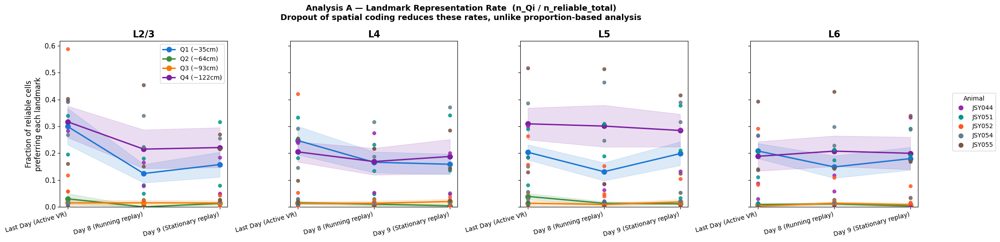

In [149]:
# ── Analysis A: Landmark representation rate (n_Qi / n_reliable_total) ──
# Fraction of ALL reliable cells in each layer that prefer each landmark.
# Normalising to total reliable cells means cells that lose spatial coding
# reduce this rate — dropout is now visible.
from scipy.stats import wilcoxon as _wilcoxon

def compute_repr_rates(animal, cond, layer):
    raw = all_results.get(animal, {}).get(cond, {}).get('_raw')
    if raw is None:
        return np.full(N_LANDMARKS, np.nan)
    lm_res      = raw['lm_res']
    layer_cells = raw['layer_cells']
    layer_idx   = layer_cells.get(layer, np.array([], dtype=int))
    n_rel       = len(layer_idx)
    if n_rel == 0:
        return np.full(N_LANDMARKS, np.nan)
    valid = lm_res['valid_cells'][layer_idx]
    pref  = lm_res['preferred_landmark'][layer_idx]
    return np.array([np.sum(valid & (pref == qi)) / n_rel for qi in range(N_LANDMARKS)])

repr_rates = {
    layer: {cond: np.array([compute_repr_rates(a, cond, layer) for a in _animals_with_peaks])
            for cond in CONDITIONS}
    for layer in LAYER_NAMES
}

x     = np.arange(len(CONDITIONS))
fig, axes = plt.subplots(1, len(LAYER_NAMES),
                         figsize=(5.2 * len(LAYER_NAMES), 5.5), sharey=True)

for ax, layer in zip(axes, LAYER_NAMES):
    for qi in range(N_LANDMARKS):
        vals   = np.array([repr_rates[layer][cond][:, qi] for cond in CONDITIONS])
        n_v    = np.sum(~np.isnan(vals), axis=1)
        mean_v = np.nanmean(vals, axis=1)
        sem_v  = np.nanstd(vals, axis=1) / np.maximum(np.sqrt(n_v), 1)
        ax.plot(x, mean_v, '-o', color=LANDMARK_COLORS[qi],
                label=f'Q{qi+1} (~{MEAN_PEAKS[qi]:.0f}cm)', lw=2.2, ms=8)
        ax.fill_between(x, mean_v - sem_v, mean_v + sem_v,
                        alpha=0.15, color=LANDMARK_COLORS[qi])
        for ci in range(len(CONDITIONS)):
            for ai, ac in enumerate(ANIMAL_COLORS[:len(_animals_with_peaks)]):
                v = vals[ci, ai]
                if not np.isnan(v):
                    ax.scatter(ci, v, s=28, color=ac, zorder=5, alpha=0.85)
    ax.set_xticks(x)
    ax.set_xticklabels(COND_LABELS, fontsize=10, rotation=15, ha='right')
    ax.set_title(layer, fontsize=15, fontweight='bold')
    ax.set_ylim(0, None)

axes[0].set_ylabel('Fraction of reliable cells\npreferring each landmark', fontsize=12)
axes[0].legend(loc='upper right', fontsize=10)
anim_handles = [Line2D([0],[0],marker='o',color='w',markerfacecolor=c,markersize=9,label=a)
                for a,c in zip(_animals_with_peaks, ANIMAL_COLORS)]
fig.legend(handles=anim_handles, fontsize=10, title='Animal',
           loc='center right', bbox_to_anchor=(1.08, 0.5))
fig.suptitle('Analysis A — Landmark Representation Rate  (n_Qi / n_reliable_total)\n'
             'Dropout of spatial coding reduces these rates, unlike proportion-based analysis',
             fontsize=13, fontweight='bold')
plt.tight_layout()
fig.savefig(os.path.join(ACROSS_ANIMALS_DIR, 'DataDriven_RepresentationRate.pdf'), bbox_inches='tight')
print('Saved: DataDriven_RepresentationRate.pdf')
plt.show()

Saved: DataDriven_Q1vsQ4_Rate.pdf


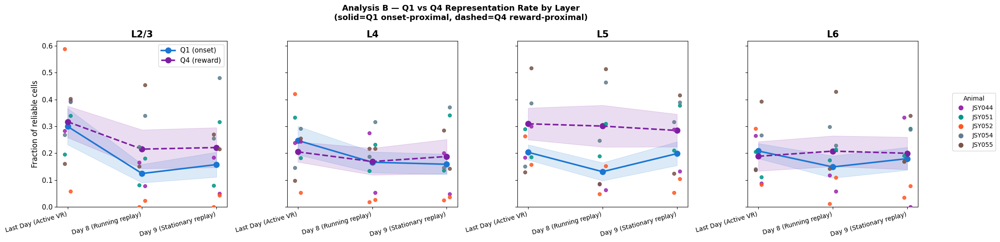


WILCOXON: Representation Rate Change  LastDay -> replay
(one-sided: testing decrease; alternative=greater on LastDay values)

--- Q1 (onset-proximal) ---
  L2/3
    vs Day 8 (Running replay): meanΔ=-0.175, W=15, p=0.0312 * (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.142, W=12, p=0.1562 ns (n=5)
  L4
    vs Day 8 (Running replay): meanΔ=-0.081, W=9, p=0.4062 ns (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.089, W=11, p=0.2188 ns (n=5)
  L5
    vs Day 8 (Running replay): meanΔ=-0.072, W=13, p=0.0938 ns (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.005, W=8, p=0.5000 ns (n=5)
  L6
    vs Day 8 (Running replay): meanΔ=-0.059, W=10, p=0.3125 ns (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.028, W=6, p=0.6875 ns (n=5)

--- Q4 (reward-proximal) ---
  L2/3
    vs Day 8 (Running replay): meanΔ=-0.102, W=12, p=0.1562 ns (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.096, W=12, p=0.1562 ns (n=5)
  L4
    vs Day 8 (Running replay): meanΔ=-0.036, W=10, p=0.3125 ns (n=5)
    vs Day 

In [ ]:
# ── Analysis B: Q1 vs Q4 representation rate by layer + Wilcoxon stats ──
# Tests whether reward-proximal (Q4) drops disproportionately more than
# onset-proximal (Q1) during replay, and whether this is layer-specific.

fig, axes = plt.subplots(1, len(LAYER_NAMES),
                         figsize=(5.2 * len(LAYER_NAMES), 5.5), sharey=True)
x = np.arange(len(CONDITIONS))

for ax, layer in zip(axes, LAYER_NAMES):
    for qi_idx, (qi, label, color, ls) in enumerate(
            [(0, 'Q1 (onset)', LANDMARK_COLORS[0], '-'),
             (3, 'Q4 (reward)', LANDMARK_COLORS[3], '--')]):
        vals   = np.array([repr_rates[layer][cond][:, qi] for cond in CONDITIONS])
        n_v    = np.sum(~np.isnan(vals), axis=1)
        mean_v = np.nanmean(vals, axis=1)
        sem_v  = np.nanstd(vals, axis=1) / np.maximum(np.sqrt(n_v), 1)
        ax.plot(x, mean_v, marker='o', ls=ls, color=color,
                label=label, lw=2.5, ms=9)
        ax.fill_between(x, mean_v - sem_v, mean_v + sem_v, alpha=0.15, color=color)
        for ci in range(len(CONDITIONS)):
            for ai, ac in enumerate(ANIMAL_COLORS[:len(_animals_with_peaks)]):
                v = vals[ci, ai]
                if not np.isnan(v):
                    jitter = (qi_idx - 0.5) * 0.08
                    ax.scatter(ci + jitter, v, s=30, color=ac, zorder=5, alpha=0.85)
    ax.set_xticks(x)
    ax.set_xticklabels(COND_LABELS, fontsize=10, rotation=15, ha='right')
    ax.set_title(layer, fontsize=15, fontweight='bold')
    ax.set_ylim(0, None)

axes[0].set_ylabel('Fraction of reliable cells', fontsize=12)
axes[0].legend(loc='upper right', fontsize=11)
anim_handles = [Line2D([0],[0],marker='o',color='w',markerfacecolor=c,markersize=9,label=a)
                for a,c in zip(_animals_with_peaks, ANIMAL_COLORS)]
fig.legend(handles=anim_handles, fontsize=10, title='Animal',
           loc='center right', bbox_to_anchor=(1.08, 0.5))
fig.suptitle('Analysis B — Q1 vs Q4 Representation Rate by Layer\n'
             '(solid=Q1 onset-proximal, dashed=Q4 reward-proximal)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
fig.savefig(os.path.join(ACROSS_ANIMALS_DIR, 'DataDriven_Q1vsQ4_Rate.pdf'), bbox_inches='tight')
print('Saved: DataDriven_Q1vsQ4_Rate.pdf')
plt.show()

print('\n' + '='*65)
print('WILCOXON: Representation Rate Change  LastDay -> replay')
print('(one-sided: testing decrease; alternative=greater on LastDay values)')
print('='*65)
for qi, lm_label in [(0, 'Q1 (onset-proximal)'), (3, 'Q4 (reward-proximal)')]:
    print(f'\n--- {lm_label} ---')
    for layer in LAYER_NAMES:
        print(f'  {layer}')
        last = repr_rates[layer]['LastDay'][:, qi]
        for cond, cond_label in zip(CONDITIONS[1:], COND_LABELS[1:]):
            rep   = repr_rates[layer][cond][:, qi]
            valid = ~np.isnan(last) & ~np.isnan(rep)
            n     = int(valid.sum())
            if n < 3:
                print(f'    vs {cond_label}: n={n}, insufficient')
                continue
            try:
                stat, p = _wilcoxon(last[valid], rep[valid], alternative='greater')
                sig   = '***' if p<0.001 else '**' if p<0.01 else '*' if p<0.05 else 'ns'
                delta = float(np.mean(rep[valid] - last[valid]))
                print(f'    vs {cond_label}: meanΔ={delta:+.3f}, W={stat:.0f}, p={p:.4f} {sig} (n={n})')
            except Exception as e:
                print(f'    vs {cond_label}: {e}')

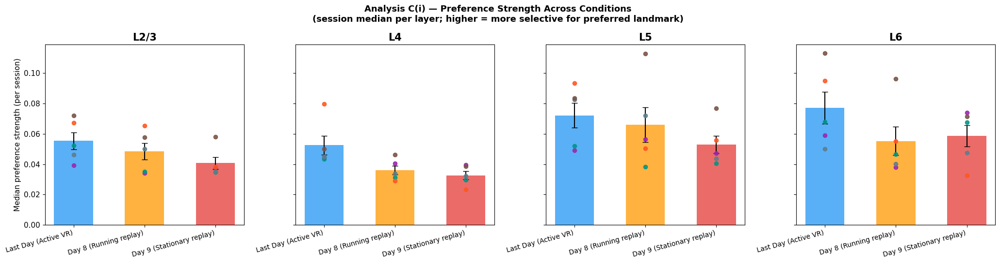


=== WILCOXON: Preference Strength  LastDay vs replay ===

  L2/3
    vs Day 8 (Running replay): meanΔ=-0.007, p=0.0938 ns (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.015, p=0.0312 * (n=5)

  L4
    vs Day 8 (Running replay): meanΔ=-0.016, p=0.0312 * (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.020, p=0.0312 * (n=5)

  L5
    vs Day 8 (Running replay): meanΔ=-0.006, p=0.3125 ns (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.019, p=0.0312 * (n=5)

  L6
    vs Day 8 (Running replay): meanΔ=-0.022, p=0.0312 * (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.018, p=0.1562 ns (n=5)
Saved: DataDriven_Q1Q4_Amplitude.pdf


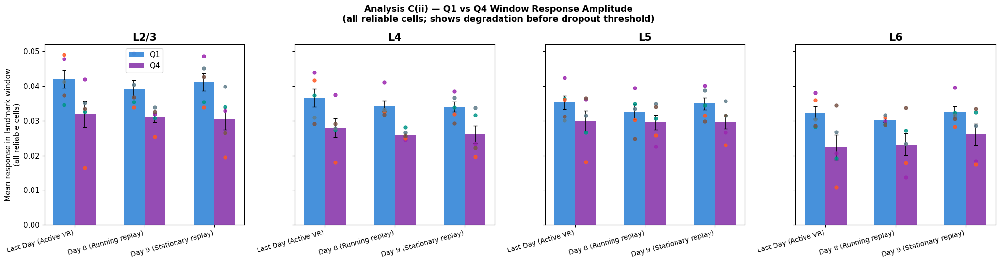


=== WILCOXON: Q4 amplitude  LastDay vs replay ===

  L2/3
    vs Day 8 (Running replay): meanΔ=-0.001, p=0.2188 ns (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.001, p=0.4062 ns (n=5)

  L4
    vs Day 8 (Running replay): meanΔ=-0.002, p=0.3125 ns (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.002, p=0.4062 ns (n=5)

  L5
    vs Day 8 (Running replay): meanΔ=-0.000, p=0.6875 ns (n=5)
    vs Day 9 (Stationary replay): meanΔ=-0.000, p=0.4062 ns (n=5)

  L6
    vs Day 8 (Running replay): meanΔ=+0.001, p=0.5938 ns (n=5)
    vs Day 9 (Stationary replay): meanΔ=+0.004, p=0.8438 ns (n=5)


In [151]:
# ── Analysis C: Preference strength + Q1/Q4 window response amplitude ──
# No cell tracking needed: each session gives one scalar (median preference
# strength or mean window amplitude). Wilcoxon across n=5 animals.

# ─ Part 1: Median preference strength per session ───────────────────────────────
pref_str_data = {layer: {cond: [] for cond in CONDITIONS} for layer in LAYER_NAMES}
for layer in LAYER_NAMES:
    for cond in CONDITIONS:
        for animal in _animals_with_peaks:
            raw = all_results.get(animal, {}).get(cond, {}).get('_raw')
            if raw is None:
                pref_str_data[layer][cond].append(np.nan); continue
            lm_res     = raw['lm_res']
            layer_idx  = raw['layer_cells'].get(layer, np.array([], dtype=int))
            valid_mask = lm_res['valid_cells'][layer_idx]
            pstr       = lm_res['preference_strength'][layer_idx][valid_mask]
            pref_str_data[layer][cond].append(float(np.median(pstr)) if len(pstr) else np.nan)

fig, axes = plt.subplots(1, len(LAYER_NAMES),
                         figsize=(5.2 * len(LAYER_NAMES), 5.5), sharey=True)
x = np.arange(len(CONDITIONS))
for ax, layer in zip(axes, LAYER_NAMES):
    for ci, (cond, cond_label, cond_color) in enumerate(zip(CONDITIONS, COND_LABELS, COND_COLORS)):
        vals   = np.array(pref_str_data[layer][cond])
        mean_v = np.nanmean(vals)
        sem_v  = np.nanstd(vals) / np.sqrt(np.sum(~np.isnan(vals)))
        ax.bar(ci, mean_v, 0.55, color=cond_color, alpha=0.75,
               yerr=sem_v, capsize=4, error_kw={'lw': 1.5})
        for ai, ac in enumerate(ANIMAL_COLORS[:len(_animals_with_peaks)]):
            if not np.isnan(vals[ai]):
                ax.scatter(ci, vals[ai], s=35, color=ac, zorder=5, alpha=0.9)
    ax.set_xticks(x)
    ax.set_xticklabels(COND_LABELS, fontsize=10, rotation=15, ha='right')
    ax.set_title(layer, fontsize=15, fontweight='bold')
axes[0].set_ylabel('Median preference strength (per session)', fontsize=11)
fig.suptitle('Analysis C(i) — Preference Strength Across Conditions\n'
             '(session median per layer; higher = more selective for preferred landmark)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
fig.savefig(os.path.join(ACROSS_ANIMALS_DIR, 'DataDriven_PreferenceStrength.pdf'), bbox_inches='tight')
plt.show()

print('\n=== WILCOXON: Preference Strength  LastDay vs replay ===')
for layer in LAYER_NAMES:
    print(f'\n  {layer}')
    last = np.array(pref_str_data[layer]['LastDay'])
    for cond, cond_label in zip(CONDITIONS[1:], COND_LABELS[1:]):
        rep   = np.array(pref_str_data[layer][cond])
        valid = ~np.isnan(last) & ~np.isnan(rep)
        n     = int(valid.sum())
        if n < 3:
            print(f'    vs {cond_label}: n={n}, insufficient'); continue
        try:
            stat, p = _wilcoxon(last[valid], rep[valid], alternative='greater')
            sig = '***' if p<0.001 else '**' if p<0.01 else '*' if p<0.05 else 'ns'
            print(f'    vs {cond_label}: meanΔ={np.mean(rep[valid]-last[valid]):+.3f}, p={p:.4f} {sig} (n={n})')
        except Exception as e:
            print(f'    vs {cond_label}: {e}')

# ─ Part 2: Mean response amplitude in Q1 and Q4 windows (ALL reliable cells) ────
amp_data = {layer: {lm: {cond: [] for cond in CONDITIONS}
                    for lm in ['Q1','Q4']} for layer in LAYER_NAMES}
for layer in LAYER_NAMES:
    for cond in CONDITIONS:
        for animal in _animals_with_peaks:
            raw = all_results.get(animal,{}).get(cond,{}).get('_raw')
            for lm_key, qi in [('Q1',0),('Q4',3)]:
                if raw is None:
                    amp_data[layer][lm_key][cond].append(np.nan); continue
                profiles    = raw['lm_res']['mean_profiles'][raw['layer_cells'].get(layer, np.array([], dtype=int))]
                bin_centers = raw['bin_centers']
                peaks_cm    = DETECTED_PEAKS[animal]
                w           = ANIMAL_WINDOW_CONFIG[animal][qi]
                lm_mask     = ((bin_centers >= peaks_cm[qi] - w['before']) &
                               (bin_centers <= peaks_cm[qi] + w['after']))
                if len(profiles) == 0 or not lm_mask.any():
                    amp_data[layer][lm_key][cond].append(np.nan)
                else:
                    amp_data[layer][lm_key][cond].append(float(np.mean(profiles[:, lm_mask])))

fig, axes = plt.subplots(1, len(LAYER_NAMES),
                         figsize=(5.2 * len(LAYER_NAMES), 5.5), sharey=True)
bar_w = 0.3
x = np.arange(len(CONDITIONS))
for ax, layer in zip(axes, LAYER_NAMES):
    for lm_key, lm_color, offset in [('Q1', LANDMARK_COLORS[0], -bar_w/2),
                                      ('Q4', LANDMARK_COLORS[3],  bar_w/2)]:
        vals   = np.array([amp_data[layer][lm_key][cond] for cond in CONDITIONS])
        mean_v = np.nanmean(vals, axis=1)
        sem_v  = np.nanstd(vals, axis=1) / np.sqrt(np.sum(~np.isnan(vals), axis=1))
        ax.bar(x + offset, mean_v, bar_w, color=lm_color, alpha=0.80, label=lm_key,
               yerr=sem_v, capsize=3, error_kw={'lw': 1.2})
        for ci in range(len(CONDITIONS)):
            for ai, ac in enumerate(ANIMAL_COLORS[:len(_animals_with_peaks)]):
                v = vals[ci, ai]
                if not np.isnan(v):
                    ax.scatter(ci + offset, v, s=25, color=ac, zorder=5, alpha=0.85)
    ax.set_xticks(x)
    ax.set_xticklabels(COND_LABELS, fontsize=10, rotation=15, ha='right')
    ax.set_title(layer, fontsize=15, fontweight='bold')
axes[0].set_ylabel('Mean response in landmark window\n(all reliable cells)', fontsize=11)
axes[0].legend(fontsize=11)
fig.suptitle('Analysis C(ii) — Q1 vs Q4 Window Response Amplitude\n'
             '(all reliable cells; shows degradation before dropout threshold)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
fig.savefig(os.path.join(ACROSS_ANIMALS_DIR, 'DataDriven_Q1Q4_Amplitude.pdf'), bbox_inches='tight')
print('Saved: DataDriven_Q1Q4_Amplitude.pdf')
plt.show()

print('\n=== WILCOXON: Q4 amplitude  LastDay vs replay ===')
for layer in LAYER_NAMES:
    print(f'\n  {layer}')
    last = np.array(amp_data[layer]['Q4']['LastDay'])
    for cond, cond_label in zip(CONDITIONS[1:], COND_LABELS[1:]):
        rep   = np.array(amp_data[layer]['Q4'][cond])
        valid = ~np.isnan(last) & ~np.isnan(rep)
        n     = int(valid.sum())
        if n < 3:
            print(f'    vs {cond_label}: n={n}, insufficient'); continue
        try:
            stat, p = _wilcoxon(last[valid], rep[valid], alternative='greater')
            sig = '***' if p<0.001 else '**' if p<0.01 else '*' if p<0.05 else 'ns'
            print(f'    vs {cond_label}: meanΔ={np.mean(rep[valid]-last[valid]):+.3f}, p={p:.4f} {sig} (n={n})')
        except Exception as e:
            print(f'    vs {cond_label}: {e}')